In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statistics as stats
import warnings 
warnings.filterwarnings('ignore')

In [19]:
data = pd.read_csv("Lol.csv")

In [20]:
data.drop(columns="Unnamed: 0",inplace=True)

In [6]:
data

,City,Location,Project Name,Property Title,Property Type,Locality,Price,BHK,Area_SqFt_Number,Area_per_SqFt_Price
0,Pune,"Nanded, Pune",Dharmavat Sunder Sanskruti Phase 3,2 BHK 1300 Sq.Ft. Apartment in Dharmavat Sunde...,Apartment,Nanded,11000000.0,2,1300.0,8462.0
1,Pune,"Nanded, Pune",Nanded City Asawari,2 BHK + Extra Room 872 Sq.Ft. Apartment in Nan...,Apartment,Nanded,8400000.0,2,872.0,9633.0
2,Pune,"Dhanori, Pune",Magnum lifestyle,1 BHK 390 Sq.Ft. Apartment in Magnum lifestyle,Apartment,Dhanori,3500000.0,1,390.0,8974.0
3,Pune,"Punawale, Pune",Somani Towers,2 BHK + Pooja Room 626 Sq.Ft. Apartment in Som...,Apartment,Punawale,6000000.0,2,626.0,9585.0
4,Pune,"Wadgaon Sheri, Pune",Mika Triton Residency,2 BHK + Extra Room 870 Sq.Ft. Apartment in Mik...,Apartment,Wadgaon Sheri,11500000.0,2,870.0,13218.0
...,...,...,...,...,...,...,...,...,...,...
805,Coimbatore,"Thudiyalur, Coimbatore",VS Avenue,"2 BHK + Pooja Room,Servant Room,Extra Room 120...",Independent House,Thudiyalur,3200000.0,2,1200.0,2667.0
806,Coimbatore,"Thudiyalur, Coimbatore",VVM GJV Anugrakha Enclave,4 BHK + Study Room 1200 Sq.Ft. Villa in VVM GJ...,Villa,Thudiyalur,7000000.0,4,1200.0,5833.0
807,Coimbatore,"Saravanampatti, Coimbatore",RR Swara,"2 BHK + Pooja Room,Servant Room,Study Room 120...",Independent House,Saravanampatti,4080000.0,2,1200.0,3400.0
808,Coimbatore,"Thudiyalur, Coimbatore",VS Avenue,3 BHK 1400 Sq.Ft. Villa in VS Avenue,Villa,Thudiyalur,7000000.0,3,1400.0,5000.0


## Splitting Numerical and Categorical Columns

In [7]:

numerical_df = data.select_dtypes(include = [int , float]).columns

categorical_df = data.select_dtypes(include = ['object']).columns

print(numerical_df)
print('*' * 85)
print(categorical_df)

Index(['Price', 'BHK', 'Area_SqFt_Number', 'Area_per_SqFt_Price'], dtype='object')
*************************************************************************************
Index(['City', 'Location', 'Project Name', 'Property Title', 'Property Type',
       'Locality'],
      dtype='object')


In [22]:
data.skew(numeric_only=True)

Price                  2.274190
BHK                    0.654564
Area_SqFt_Number       1.983713
Area_per_SqFt_Price    2.013812
dtype: float64

In [24]:
data.columns

Index(['City', 'Location', 'Project Name', 'Property Title', 'Property Type',
       'Locality', 'Price', 'BHK', 'Area_SqFt_Number', 'Area_per_SqFt_Price'],
      dtype='object')

## Univariate Analysis:

In [10]:
def plot_numerical_analysis(df , column):
    
    plt.figure(figsize = (15,10))

    #Histogram
    plt.subplot(2,2,1)
    sns.histplot(x = column , data = df , color = 'skyblue' , edgecolor = 'black' , bins = 5)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    #KDE plot
    plt.subplot(2,2,2)
    sns.kdeplot(x = column , data = df , color = 'darkred')
    plt.title(f'KDE of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    #Boxplot
    plt.subplot(2,2,3)
    sns.boxplot(x = column , data = df , color = 'lightgreen')
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    plt.show()

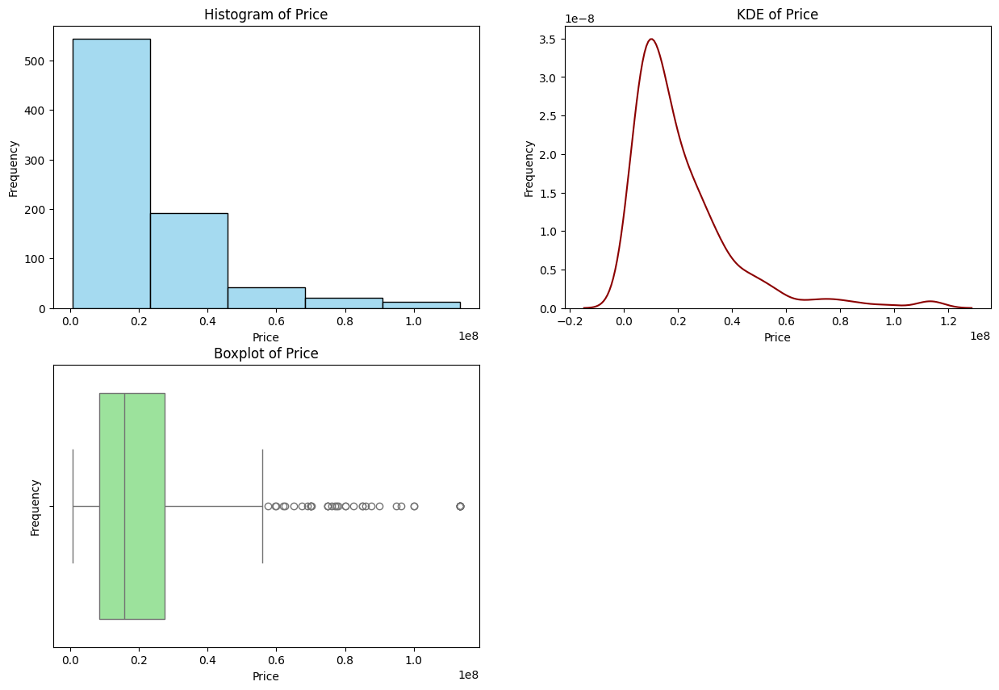

In [11]:
plot_numerical_analysis(data , 'Price')

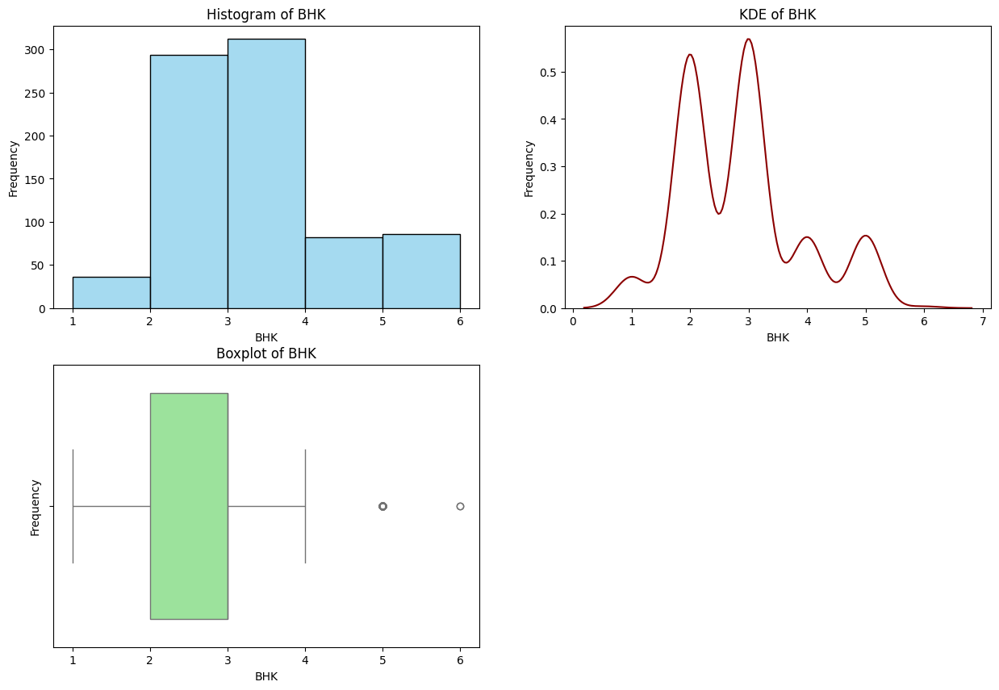

In [12]:
plot_numerical_analysis(data , 'BHK')

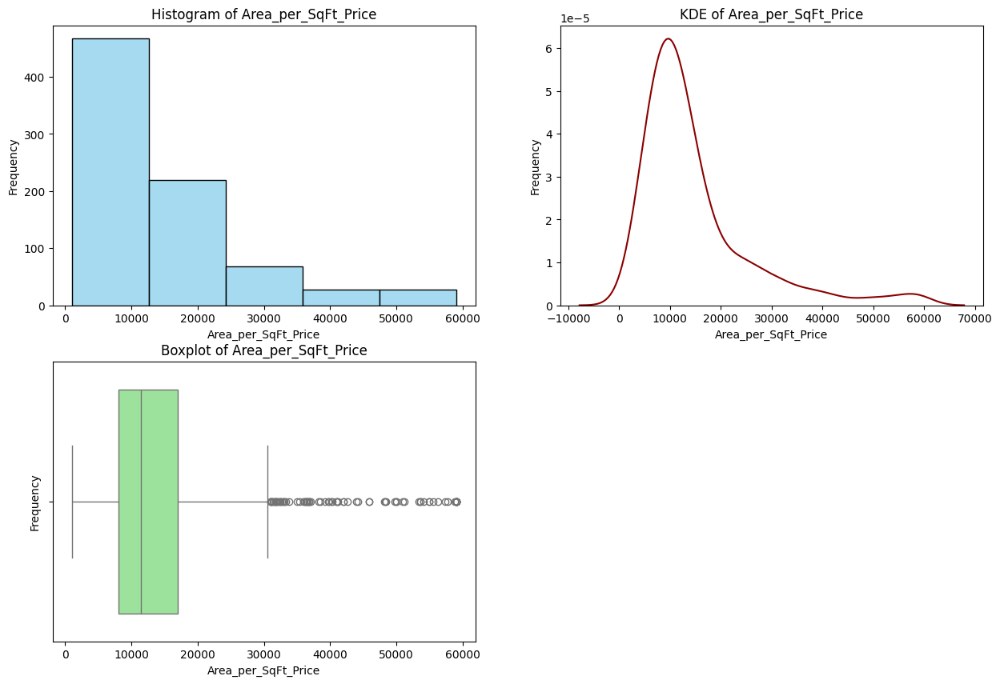

In [13]:
plot_numerical_analysis(data , 'Area_per_SqFt_Price')

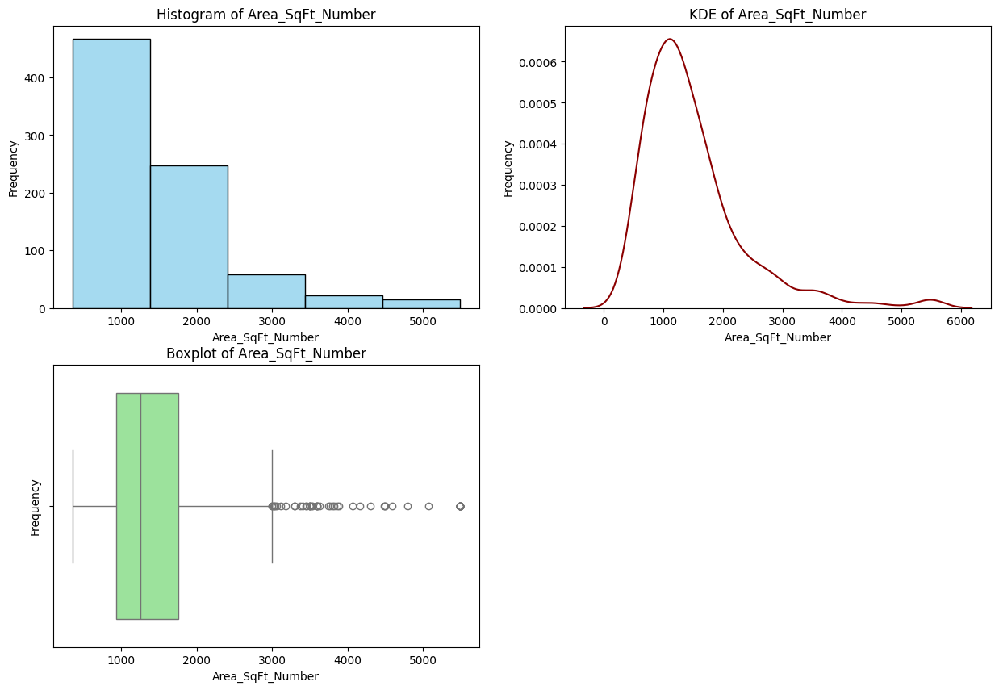

In [14]:
plot_numerical_analysis(data , 'Area_SqFt_Number')

In [25]:
data.drop(columns=["Property Title","Locality"],inplace=True)

In [34]:
data.skew()

TypeError: could not convert string to float: 'Pune'

City                                  Surat
Location               Yelahanka, Bangalore
Project Name              Yuva Blue Meadows
Property Type                         Villa
Price                           113468000.0
BHK                                       6
Area_SqFt_Number                    5492.69
Area_per_SqFt_Price                59063.46
dtype: object

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 810 entries, 0 to 809
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   City                 810 non-null    object 
 1   Location             810 non-null    object 
 2   Project Name         810 non-null    object 
 3   Property Type        810 non-null    object 
 4   Price                810 non-null    float64
 5   BHK                  810 non-null    int64  
 6   Area_SqFt_Number     810 non-null    float64
 7   Area_per_SqFt_Price  810 non-null    float64
dtypes: float64(3), int64(1), object(4)
memory usage: 50.8+ KB


## Univariate Analysis Categorical Column

Text(0, 0.5, '')

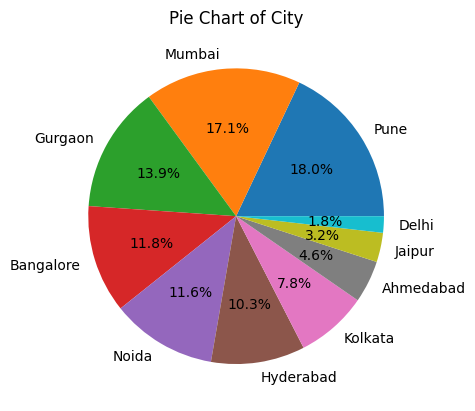

In [21]:
data["City"].value_counts().nlargest(10).plot.pie(autopct = '%1.1f%%' , color = sns.color_palette('Set2'))
plt.title(f'Pie Chart of {"City"}')
plt.ylabel('')

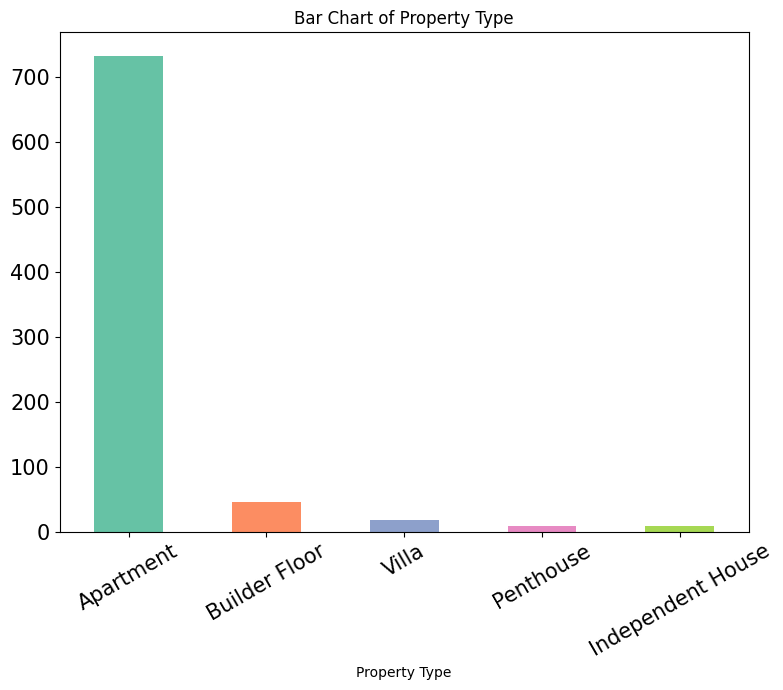

In [30]:
plt.figure(figsize = (8,7))
data["Property Type"].value_counts().nlargest(8).plot.bar(color = sns.color_palette('Set2') , fontsize = 15)
plt.title(f'Bar Chart of {"Property Type"}')
plt.xticks(rotation = 30)
plt.tight_layout()
plt.show()
#plt.savefig('type_bar_cat.png')

Text(0, 0.5, '')

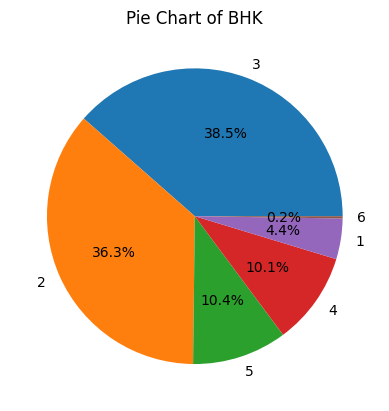

In [31]:
data["BHK"].value_counts().nlargest(10).plot.pie(autopct = '%1.1f%%' , color = sns.color_palette('Set2'))
plt.title(f'Pie Chart of {"BHK"}')
plt.ylabel('')

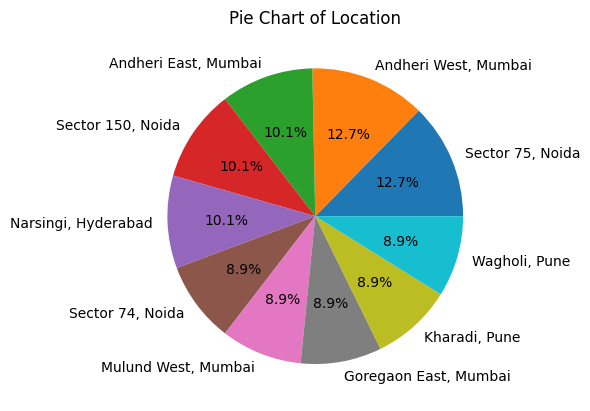

In [35]:
data["Location"].value_counts().nlargest(10).plot.pie(autopct = '%1.1f%%' , color = sns.color_palette('Set2'))
plt.title(f'Pie Chart of {"Location"}')
plt.ylabel('')
plt.show()

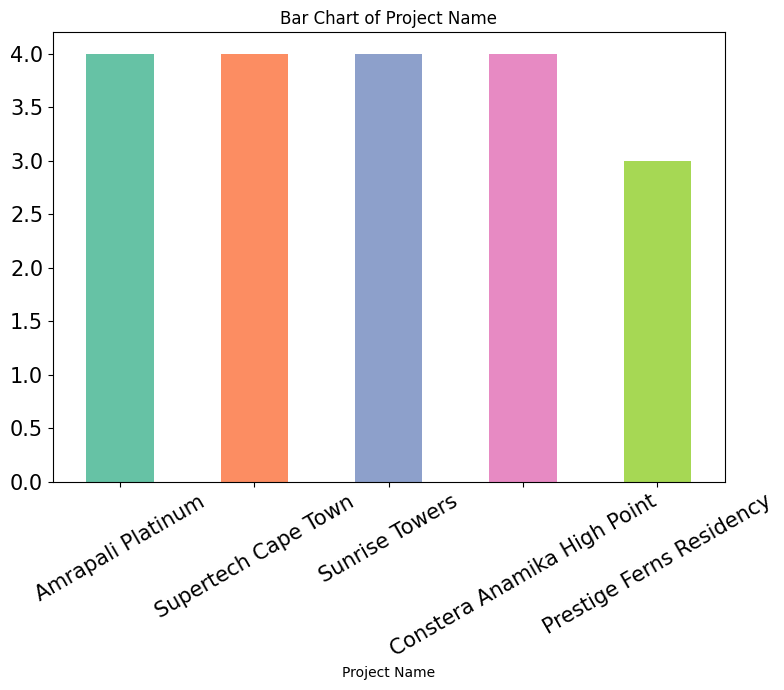

In [37]:
plt.figure(figsize = (8,7))
data["Project Name"].value_counts().nlargest(5).plot.bar(color = sns.color_palette('Set2') , fontsize = 15)
plt.title(f'Bar Chart of {"Project Name"}')
plt.xticks(rotation = 30)
plt.tight_layout()
plt.show()

## Bivariate Analysis

#### Numerical - Numerical

In [58]:
print(numerical_df)
print('-'*80)
print(categorical_df)

Index(['Price', 'BHK', 'Area_SqFt_Number', 'Area_per_SqFt_Price'], dtype='object')
--------------------------------------------------------------------------------
Index(['City', 'Location', 'Project Name', 'Property Type'], dtype='object')


In [41]:
# numerical vs numerical 
def num_num(data, column1 , column2):
    plt.scatter(x = data[column1], y = data[column2])
    

Text(0, 0.5, 'Price')

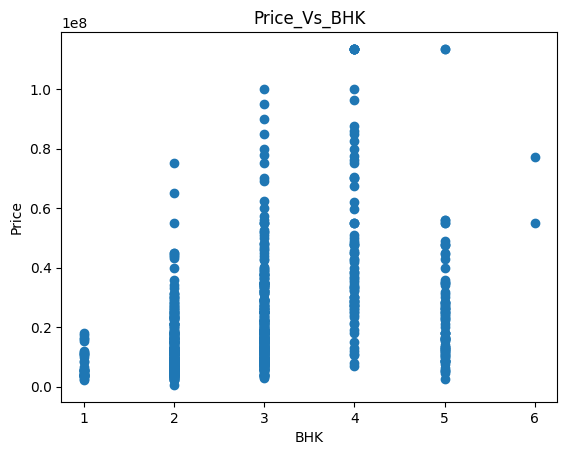

In [45]:
num_num(data, 'BHK','Price')
plt.title('Price_Vs_BHK')
plt.xlabel('BHK')
plt.ylabel('Price')

Text(0, 0.5, 'Area_SqFt_Number')

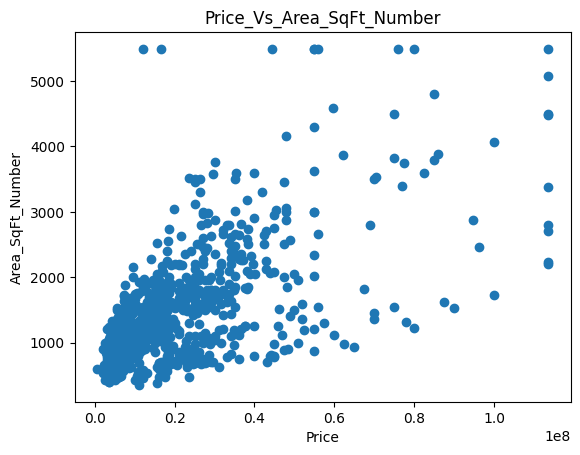

In [48]:
num_num(data, 'Price','Area_SqFt_Number')
plt.title('Price_Vs_Area_SqFt_Number')
plt.xlabel('Price')
plt.ylabel('Area_SqFt_Number')

Text(0, 0.5, 'Area_SqFt_Number')

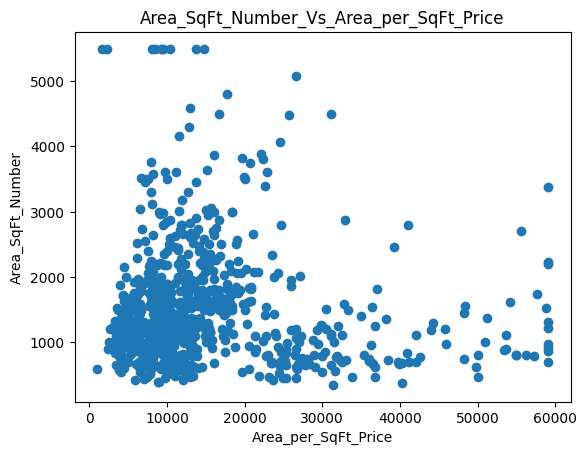

In [51]:
num_num(data, 'Area_per_SqFt_Price','Area_SqFt_Number')
plt.title('Area_SqFt_Number_Vs_Area_per_SqFt_Price')
plt.xlabel('Area_per_SqFt_Price')
plt.ylabel('Area_SqFt_Number')

Text(0, 0.5, 'Area_SqFt_Number')

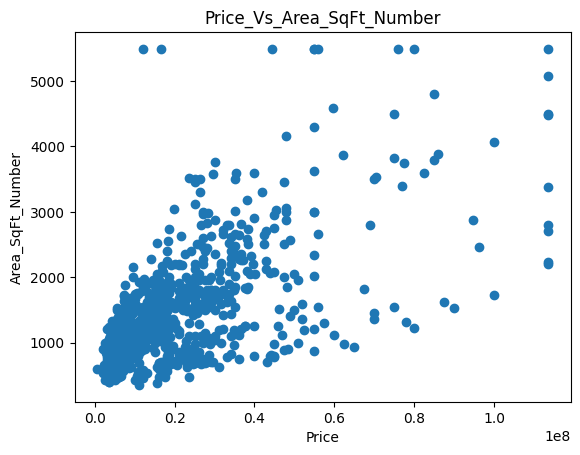

In [54]:
num_num(data, 'Price','Area_SqFt_Number')
plt.title('Price_Vs_Area_SqFt_Number')
plt.xlabel('Price')
plt.ylabel('Area_SqFt_Number')

Text(0, 0.5, 'Area_per_SqFt_Price')

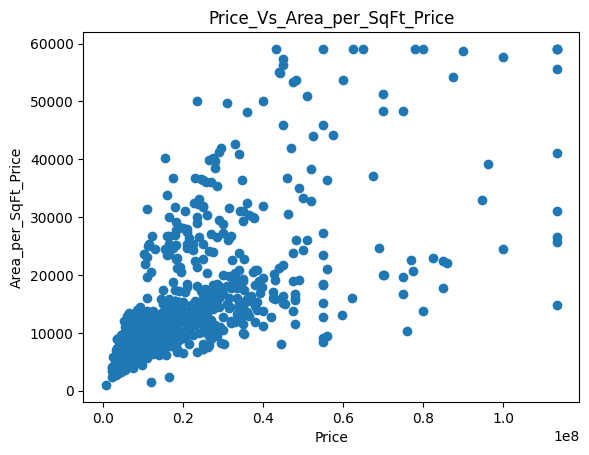

In [55]:
num_num(data, 'Price','Area_per_SqFt_Price')
plt.title('Price_Vs_Area_per_SqFt_Price')
plt.xlabel('Price')
plt.ylabel('Area_per_SqFt_Price')

#### Categorical To Categorical

In [59]:
print(categorical_df)

Index(['City', 'Location', 'Project Name', 'Property Type'], dtype='object')


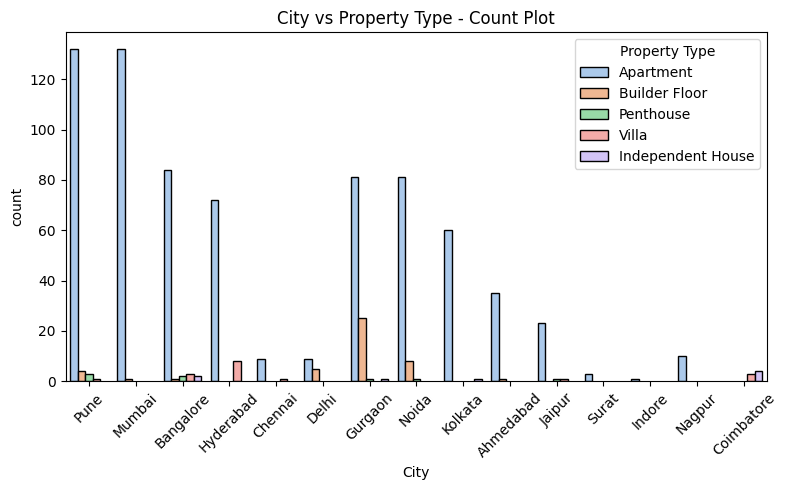

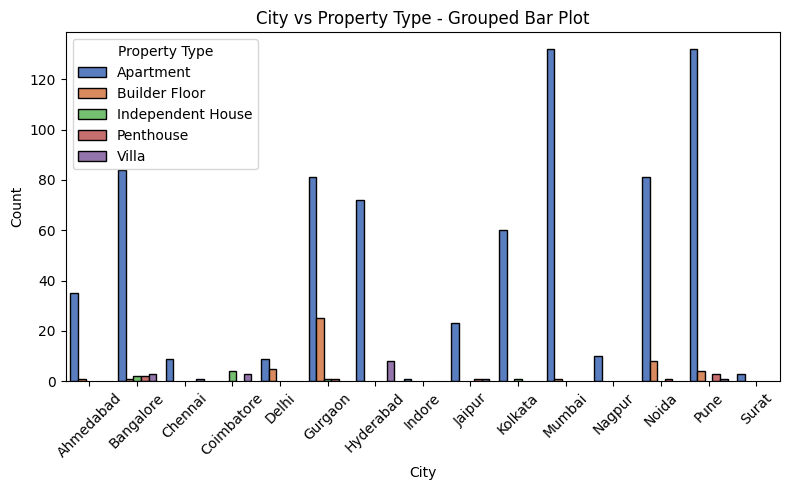

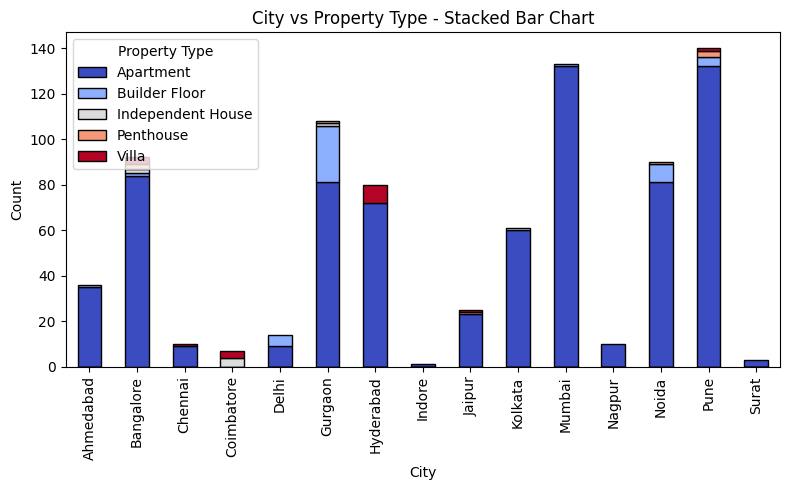

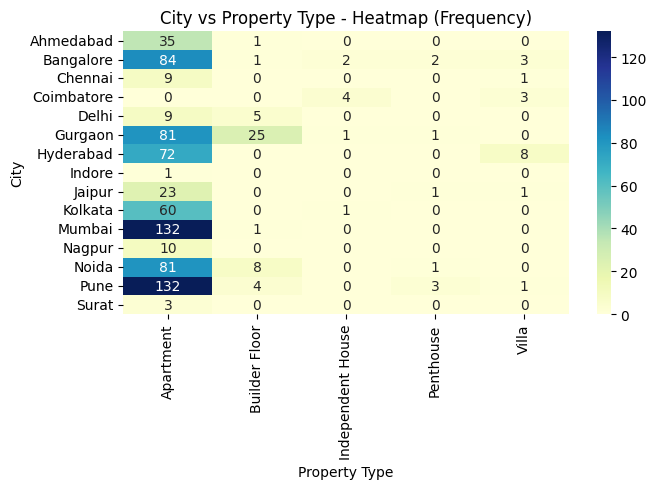

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic

# Load data

data = pd.read_csv("Lol.csv")

# Example categorical columns (change if needed)
cat1 = 'City'
cat2 = 'Property Type'

# 1️⃣ Count Plot with Hue
plt.figure(figsize=(8,5))
sns.countplot(data=data, x=cat1, hue=cat2, palette='pastel', edgecolor='black')
plt.title(f"{cat1} vs {cat2} - Count Plot")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2️⃣ Grouped Bar Plot
grouped = data.groupby([cat1, cat2]).size().reset_index(name='Count')
plt.figure(figsize=(8,5))
sns.barplot(data=grouped, x=cat1, y='Count', hue=cat2, palette='muted', edgecolor='black')
plt.title(f"{cat1} vs {cat2} - Grouped Bar Plot")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 3️⃣ Stacked Bar Chart
ct = pd.crosstab(data[cat1], data[cat2])
ct.plot(kind='bar', stacked=True, figsize=(8,5), colormap='coolwarm', edgecolor='black')
plt.title(f"{cat1} vs {cat2} - Stacked Bar Chart")
plt.xlabel(cat1)
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# 4️⃣ Heatmap (Crosstab)
plt.figure(figsize=(7,5))
sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
plt.title(f"{cat1} vs {cat2} - Heatmap (Frequency)")
plt.tight_layout()
plt.show()


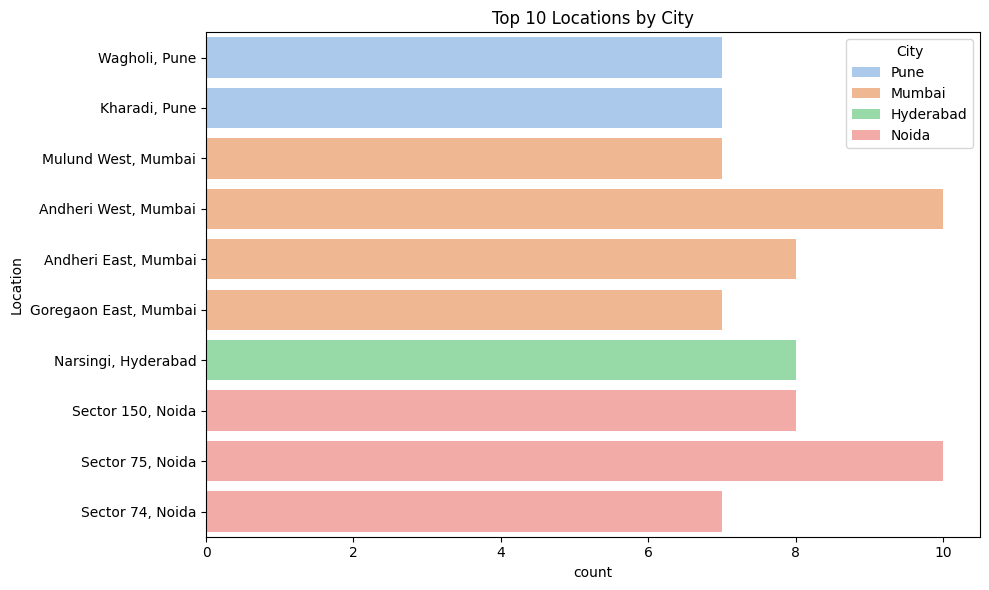

In [71]:
top_locations = data['Location'].value_counts().head(10).index
filtered = data[data['Location'].isin(top_locations)]
plt.figure(figsize=(10,6))
sns.countplot(data=filtered, y='Location', hue='City', palette='pastel')
plt.title("Top 10 Locations by City")
plt.tight_layout()
plt.show()


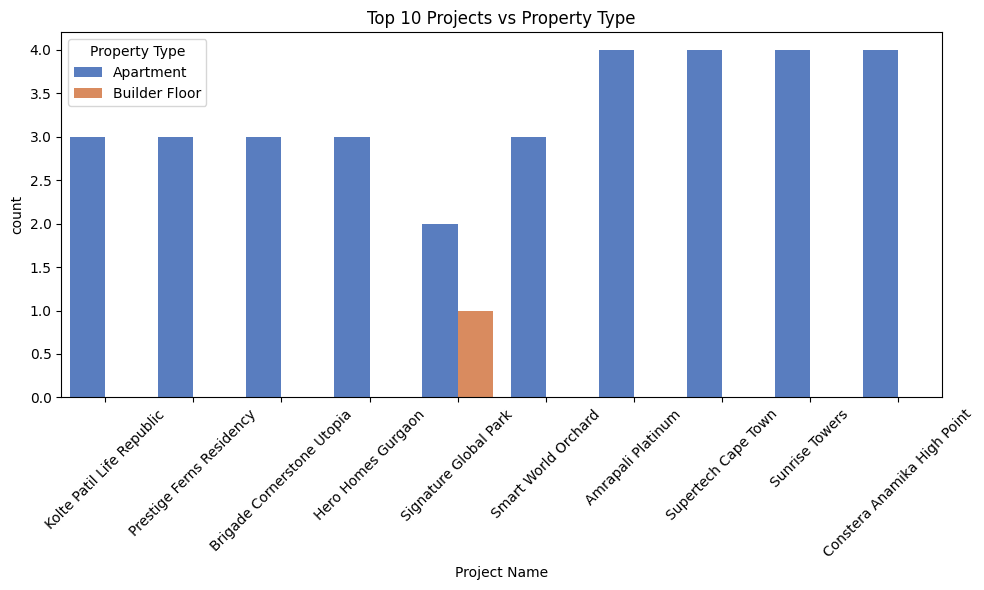

In [72]:
top_projects = data['Project Name'].value_counts().head(10).index
filtered = data[data['Project Name'].isin(top_projects)]
plt.figure(figsize=(10,6))
sns.countplot(data=filtered, x='Project Name', hue='Property Type', palette='muted')
plt.title("Top 10 Projects vs Property Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


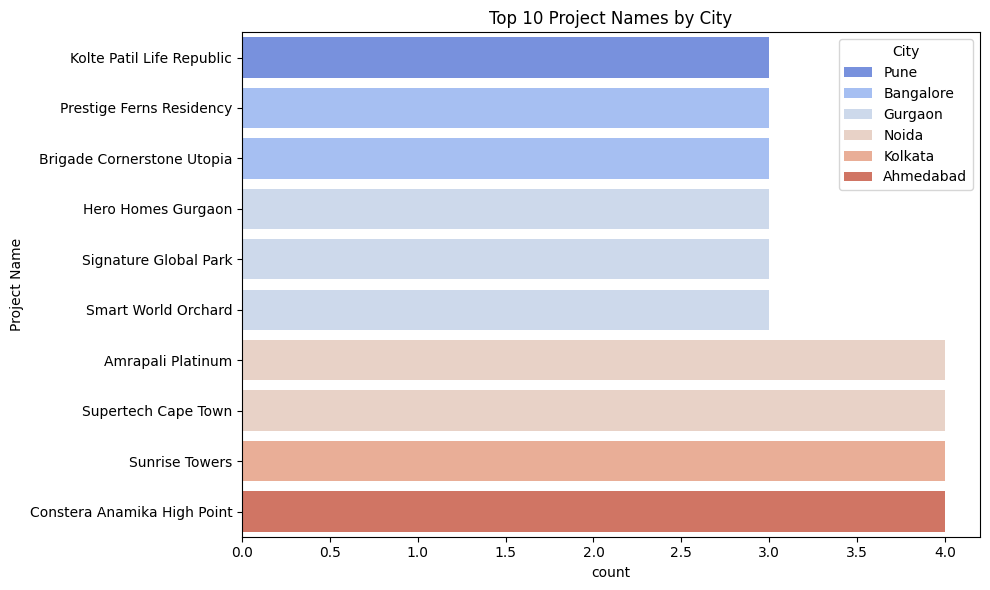

In [73]:
top_projects = data['Project Name'].value_counts().head(10).index
filtered = data[data['Project Name'].isin(top_projects)]
plt.figure(figsize=(10,6))
sns.countplot(data=filtered, y='Project Name', hue='City', palette='coolwarm')
plt.title("Top 10 Project Names by City")
plt.tight_layout()
plt.show()


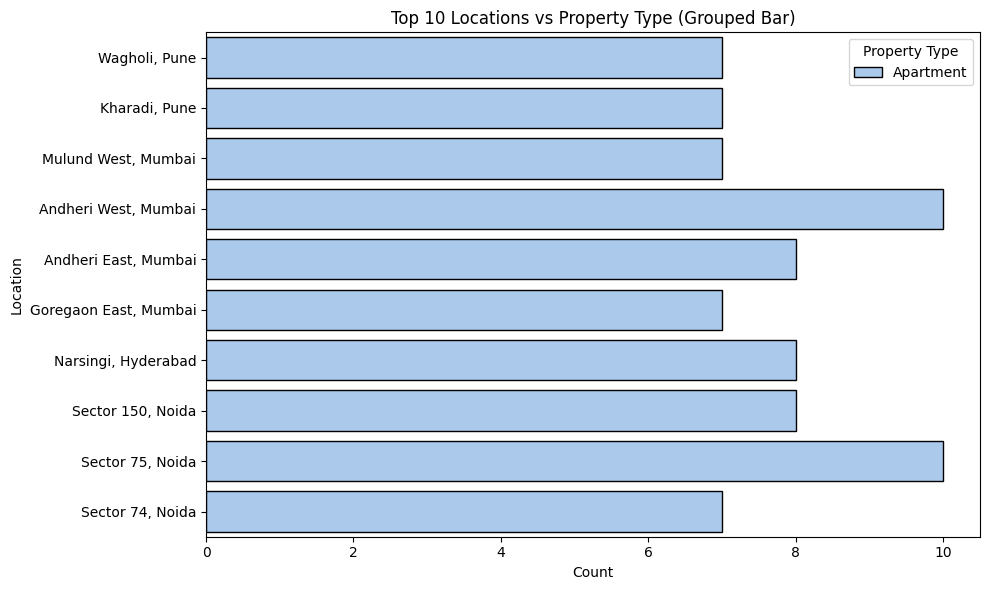

In [78]:
top_locations = data['Location'].value_counts().head(10).index
filtered = data[data['Location'].isin(top_locations)]

plt.figure(figsize=(10,6))
sns.countplot(data=filtered, y='Location', hue='Property Type', palette='pastel', edgecolor='black')
plt.title("Top 10 Locations vs Property Type (Grouped Bar)")
plt.xlabel("Count")
plt.ylabel("Location")
plt.legend(title="Property Type")
plt.tight_layout()
plt.show()

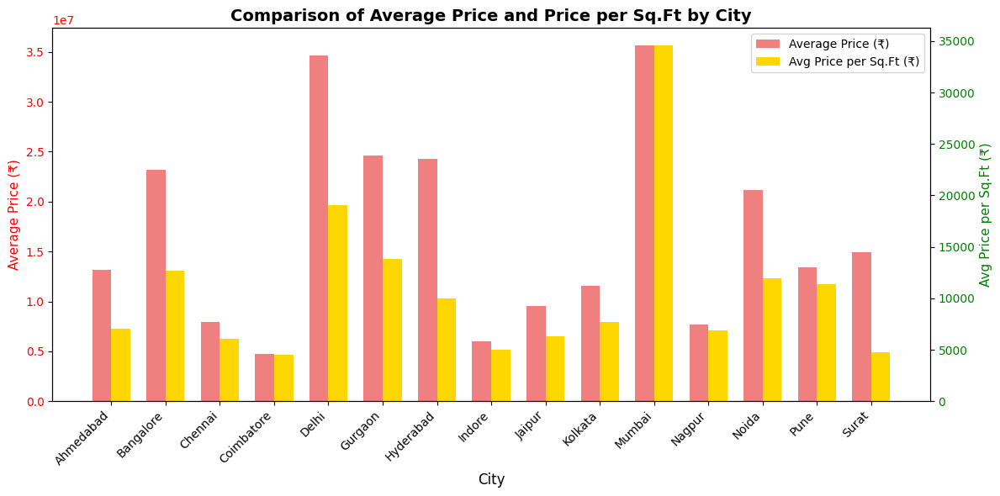

In [79]:

data = pd.read_csv('Lol.csv')

# Step 1: Group by City and calculate averages
grouped = data.groupby('City')[['Price', 'Area_per_SqFt_Price']].mean().reset_index()

# Step 2: Set bar positions
cities = grouped['City']
x = np.arange(len(cities))
width = 0.35  # width of bars

# Step 3: Create the figure
fig, ax1 = plt.subplots(figsize=(12,6))

# --- Left Y-Axis (Price) ---
bar1 = ax1.bar(x - width/2, grouped['Price'], width, label='Average Price (₹)', color='lightcoral')
ax1.set_ylabel('Average Price (₹)', color='red', fontsize=11)
ax1.tick_params(axis='y', labelcolor='red')

# --- Right Y-Axis (Price per Sq.Ft) ---
ax2 = ax1.twinx()
bar2 = ax2.bar(x + width/2, grouped['Area_per_SqFt_Price'], width, label='Avg Price per Sq.Ft (₹)', color='gold')
ax2.set_ylabel('Avg Price per Sq.Ft (₹)', color='green', fontsize=11)
ax2.tick_params(axis='y', labelcolor='green')

# --- X-Axis ---
ax1.set_xlabel('City', fontsize=12)
ax1.set_xticks(x)
ax1.set_xticklabels(cities, rotation=45, ha='right')

# --- Title ---
plt.title('Comparison of Average Price and Price per Sq.Ft by City', fontsize=14, fontweight='bold')

# --- Legends ---
fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)

# --- Layout ---
plt.tight_layout()
plt.show()

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def categorical_vs_numerical_analysis(df, top_n=10):
    """
    Performs complete bivariate analysis between categorical and numerical variables.
    Generates Box Plot, Violin Plot, Bar Plot, Strip Plot, and Box+Swarm Plot 
    for each categorical column vs each numerical column.
    
    Parameters:
    df (DataFrame): Input dataset
    top_n (int): Number of top categories to visualize (default=10)
    """

    # Detect categorical and numerical columns
    cat_cols = df.select_dtypes(include=['object']).columns.tolist()
    num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    print("📋 Categorical Columns:", cat_cols)
    print("📊 Numerical Columns:", num_cols)
    print("-" * 80)

    # Loop through each categorical-numerical pair
    for cat in cat_cols:
        for num in num_cols:
            print(f"\n🔹 Analyzing '{cat}' vs '{num}'")

            # Prepare top categories only
            top_categories = df[cat].value_counts().nlargest(top_n).index
            temp_df = df[df[cat].isin(top_categories)]

            # Skip if column empty or numeric invalid
            if temp_df[num].nunique() <= 1:
                print(f"⚠️ Skipping {num} — not enough variation.")
                continue

            # Create 5 Subplots for each pair
            plt.figure(figsize=(16, 20))

            # 1️⃣ Box Plot
            plt.subplot(5, 1, 1)
            sns.boxplot(data=temp_df, x=cat, y=num, palette='pastel')
            plt.title(f"Box Plot — {num} by {cat}")
            plt.xticks(rotation=45)
            plt.xlabel(cat)
            plt.ylabel(num)

            # 2️⃣ Violin Plot
            plt.subplot(5, 1, 2)
            sns.violinplot(data=temp_df, x=cat, y=num, palette='coolwarm')
            plt.title(f"Violin Plot — {num} by {cat}")
            plt.xticks(rotation=45)
            plt.xlabel(cat)
            plt.ylabel(num)

            # 3️⃣ Bar Plot (Mean)
            plt.subplot(5, 1, 3)
            sns.barplot(data=temp_df, x=cat, y=num, estimator=np.mean, palette='viridis', edgecolor='black')
            plt.title(f"Bar Plot (Mean) — {num} by {cat}")
            plt.xticks(rotation=45)
            plt.xlabel(cat)
            plt.ylabel(f"Average {num}")

            # 4️⃣ Strip Plot (Individual Points)
            plt.subplot(5, 1, 4)
            sns.stripplot(data=temp_df, x=cat, y=num, jitter=True, alpha=0.5, palette='Set2')
            plt.title(f"Strip Plot — {num} by {cat}")
            plt.xticks(rotation=45)
            plt.xlabel(cat)
            plt.ylabel(num)

            # 5️⃣ Box + Swarm Plot (Combo)
            plt.subplot(5, 1, 5)
            sns.boxplot(data=temp_df, x=cat, y=num, palette='pastel')
            sns.swarmplot(data=temp_df, x=cat, y=num, color='black', alpha=0.5)
            plt.title(f"Box + Swarm Plot — {num} by {cat}")
            plt.xticks(rotation=45)
            plt.xlabel(cat)
            plt.ylabel(num)

            plt.tight_layout(pad=3)
            plt.show()


📋 Categorical Columns: ['City', 'Location', 'Project Name', 'Property Title', 'Property Type', 'Locality']
📊 Numerical Columns: ['Price', 'BHK', 'Area_SqFt_Number', 'Area_per_SqFt_Price']
--------------------------------------------------------------------------------

🔹 Analyzing 'City' vs 'Price'


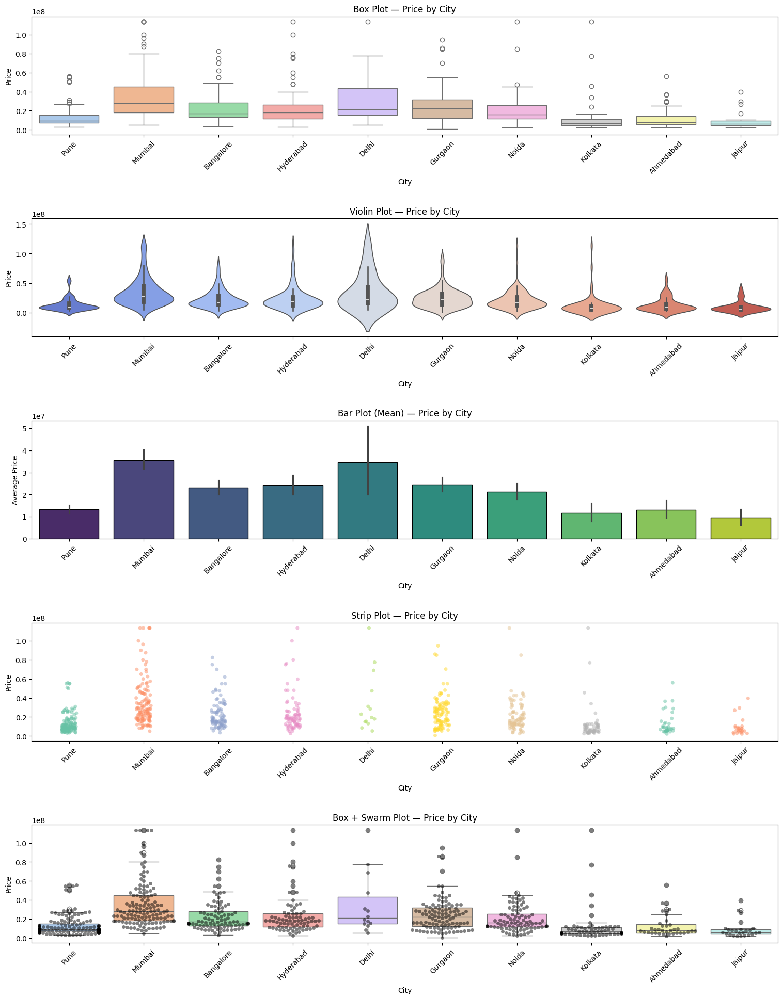


🔹 Analyzing 'City' vs 'BHK'


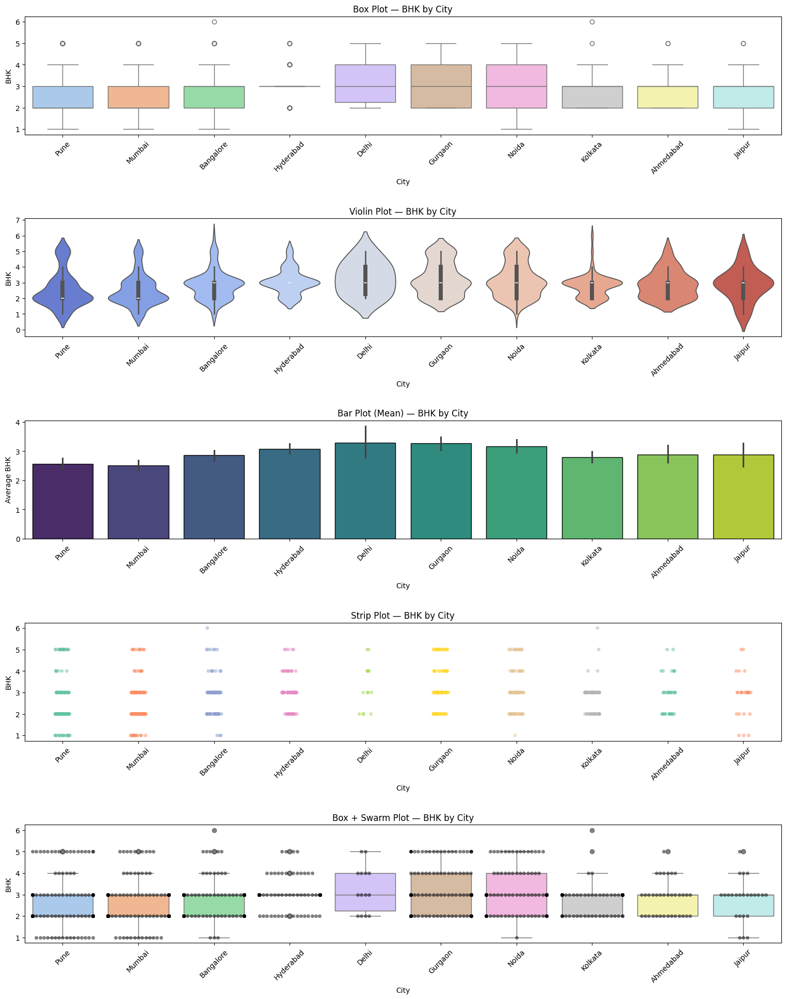


🔹 Analyzing 'City' vs 'Area_SqFt_Number'


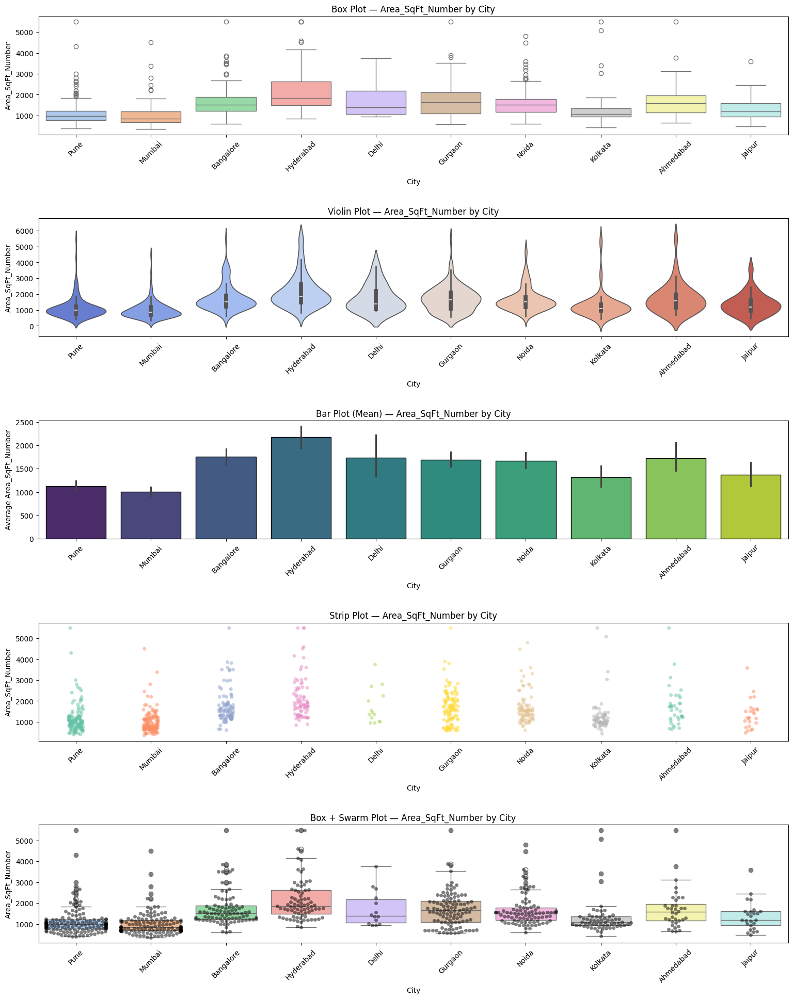


🔹 Analyzing 'City' vs 'Area_per_SqFt_Price'


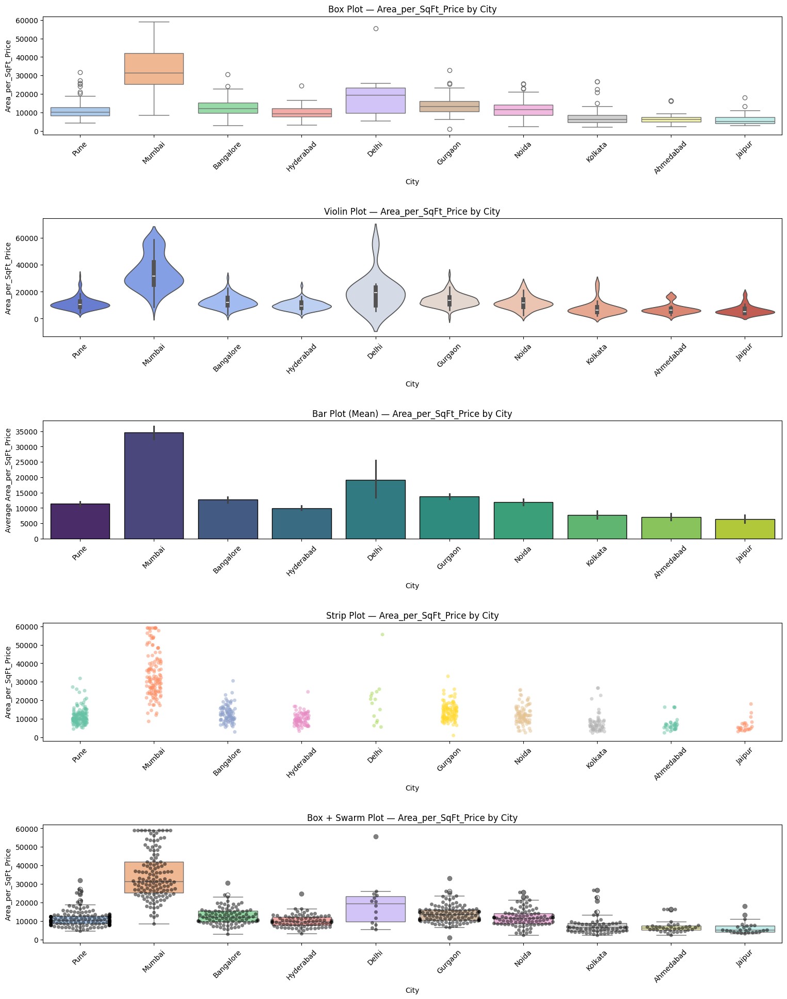


🔹 Analyzing 'Location' vs 'Price'


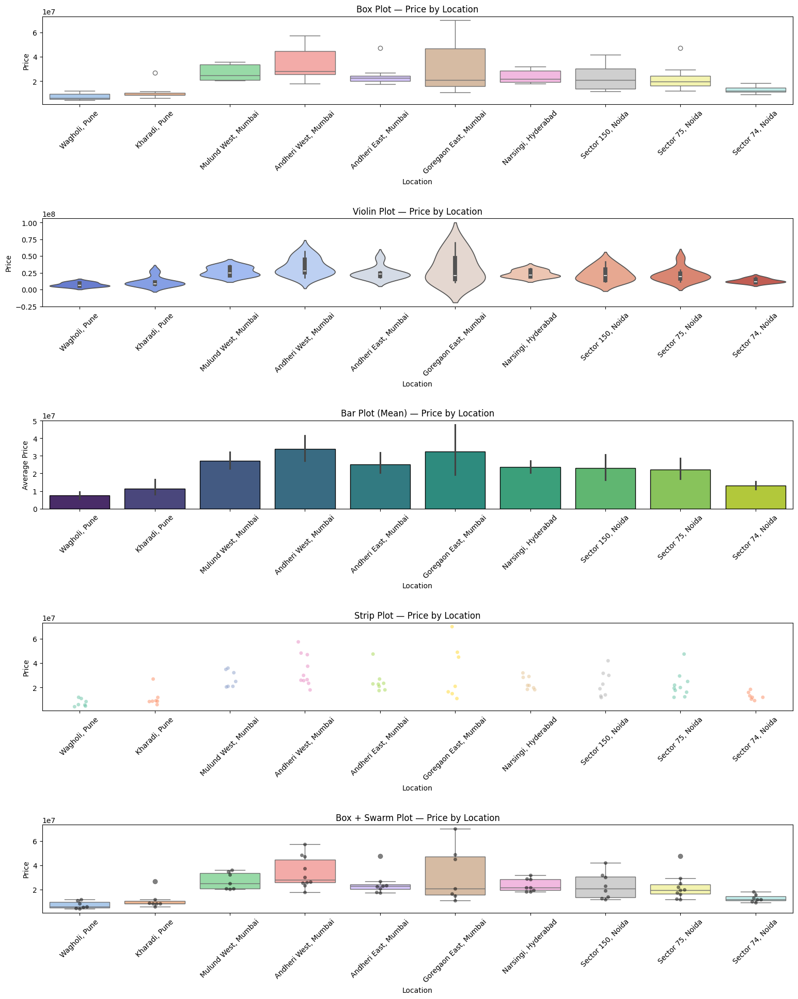


🔹 Analyzing 'Location' vs 'BHK'


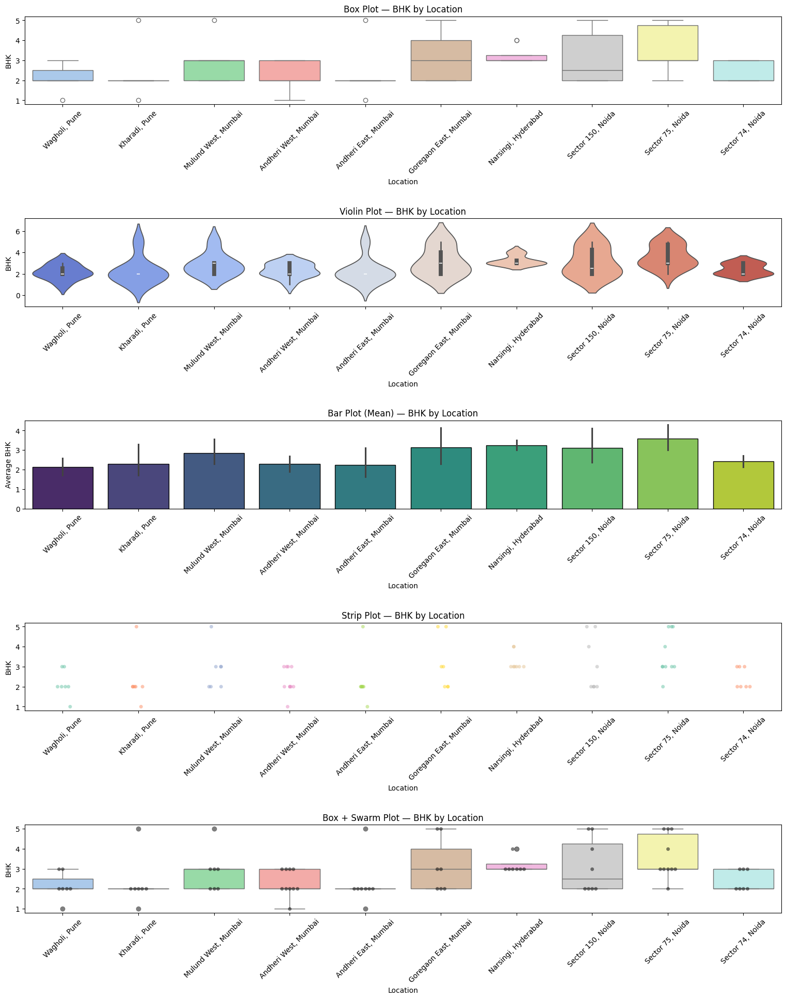


🔹 Analyzing 'Location' vs 'Area_SqFt_Number'


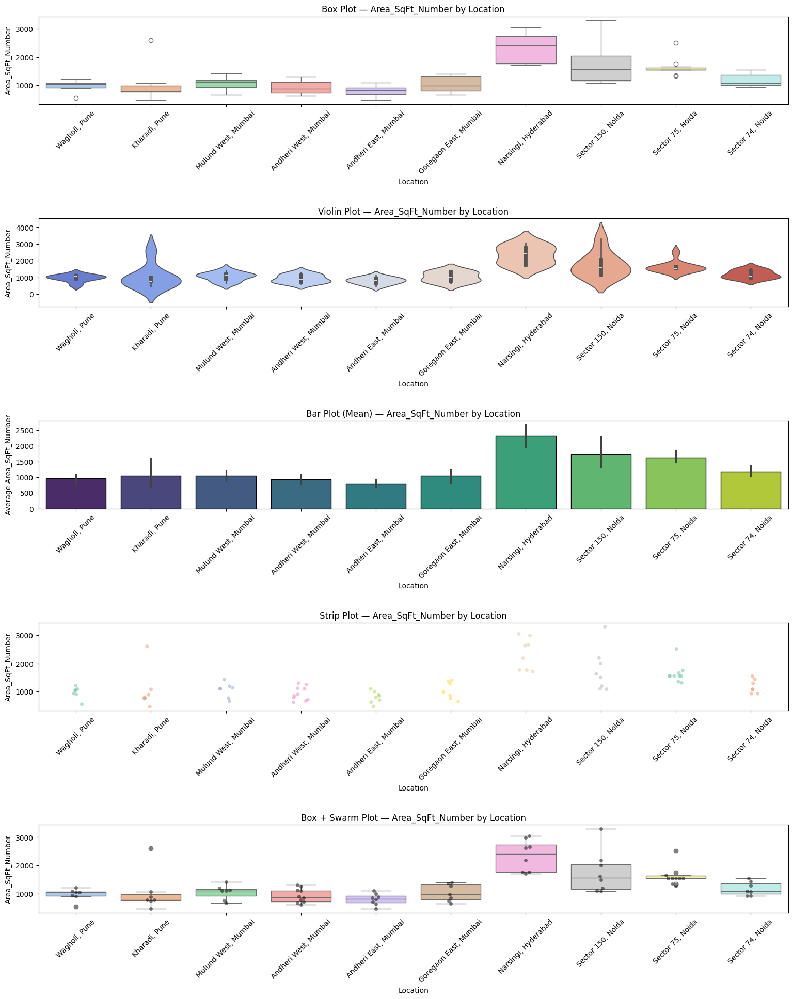


🔹 Analyzing 'Location' vs 'Area_per_SqFt_Price'


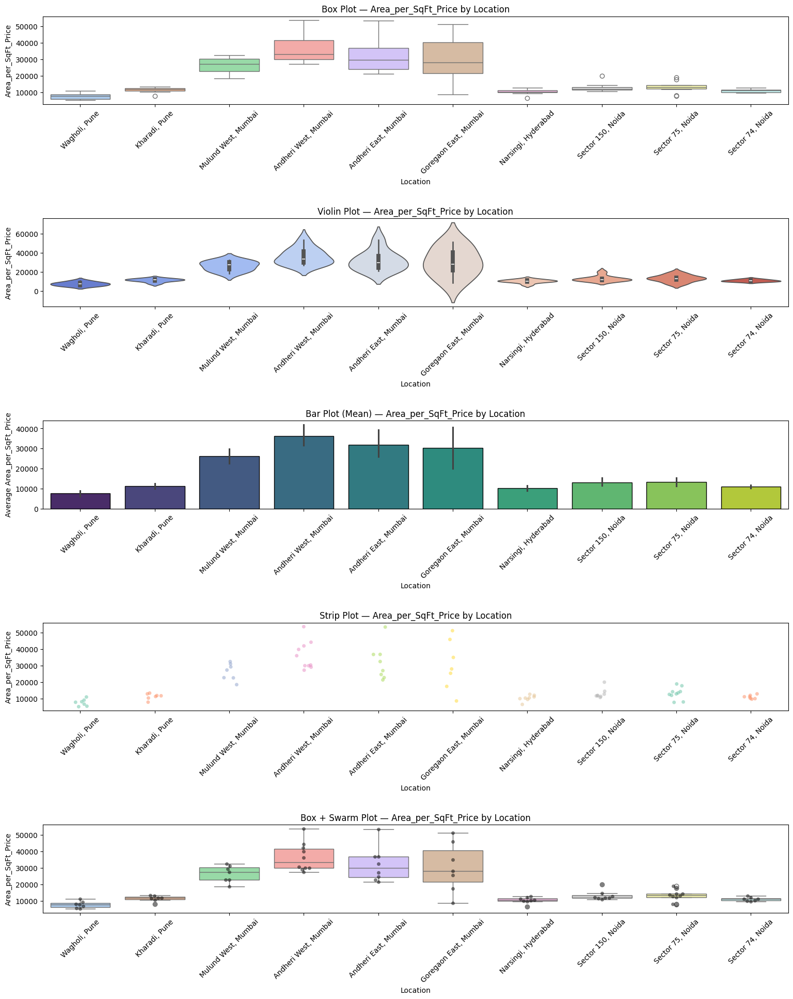


🔹 Analyzing 'Project Name' vs 'Price'


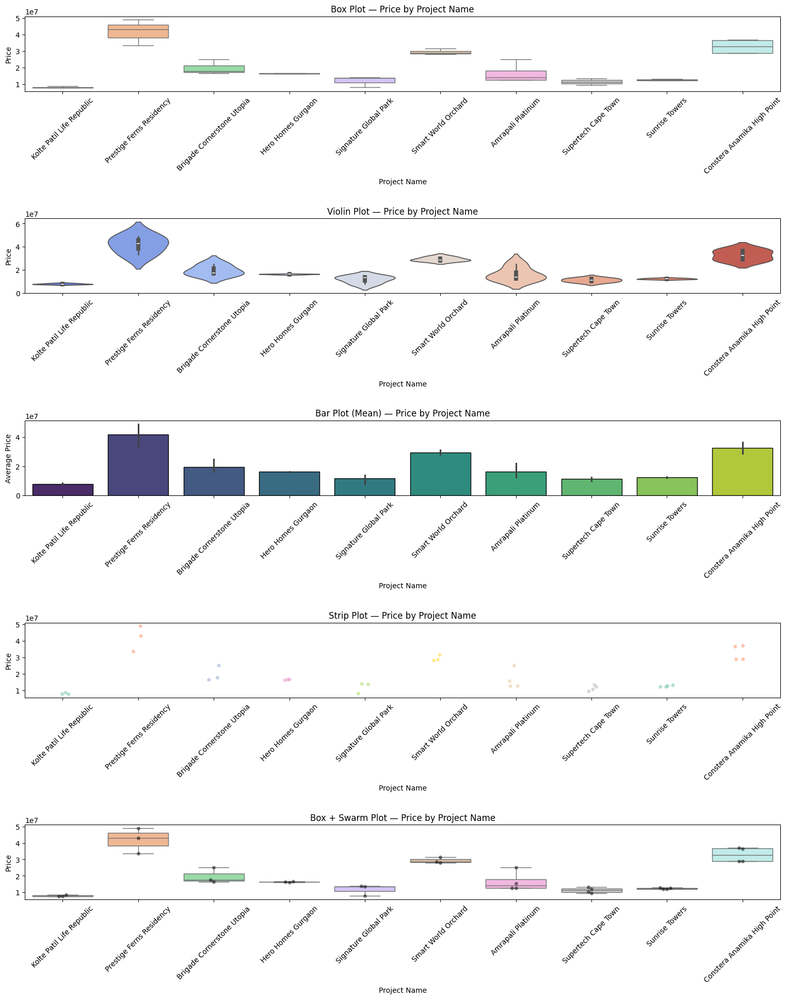


🔹 Analyzing 'Project Name' vs 'BHK'


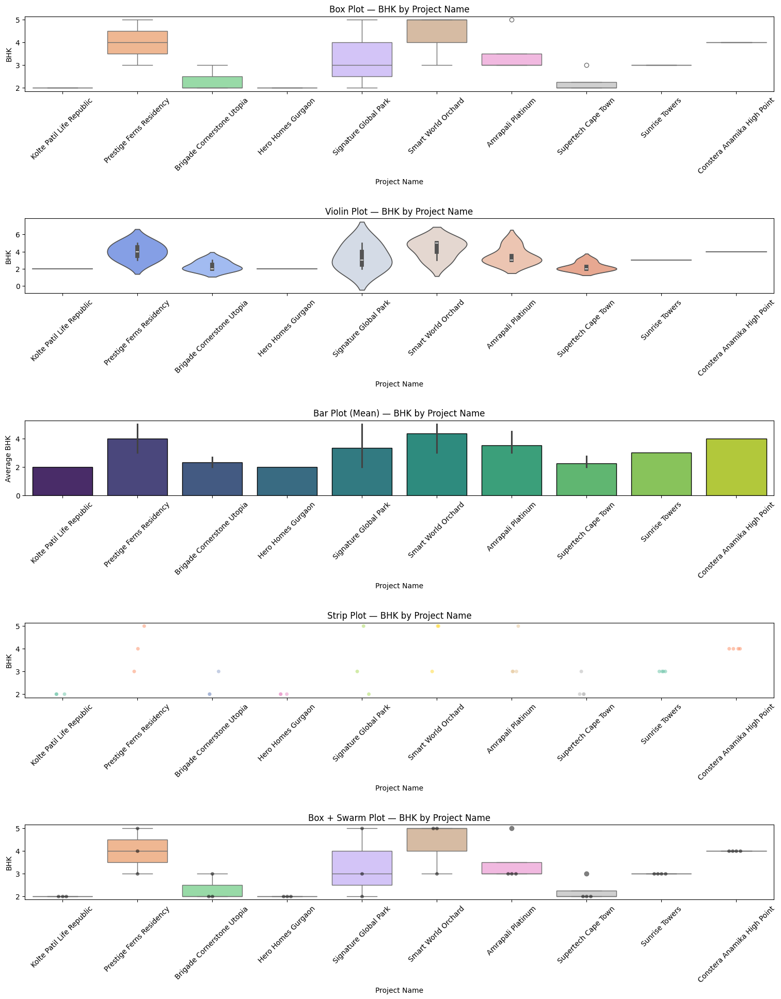


🔹 Analyzing 'Project Name' vs 'Area_SqFt_Number'


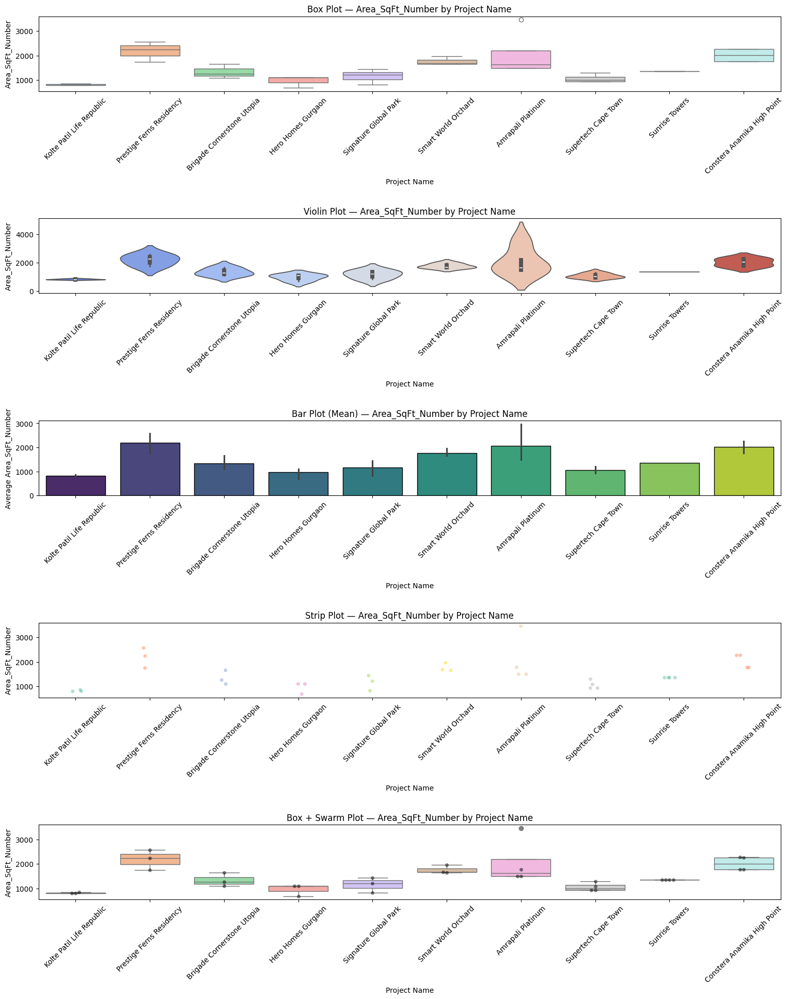


🔹 Analyzing 'Project Name' vs 'Area_per_SqFt_Price'


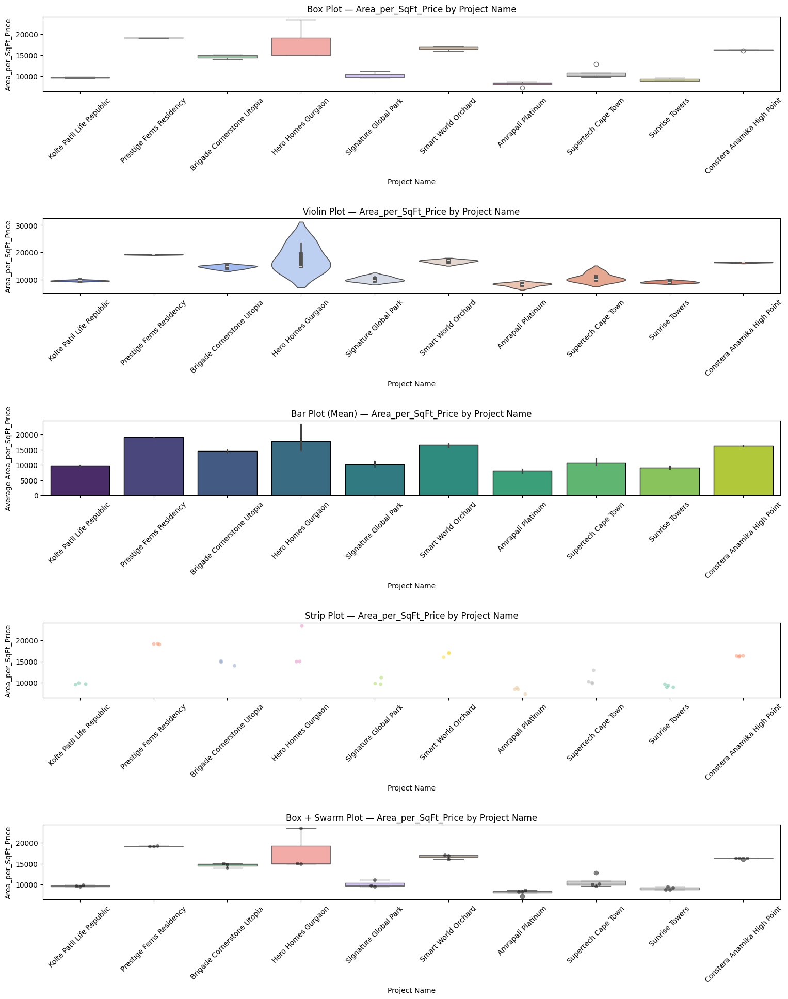


🔹 Analyzing 'Property Title' vs 'Price'


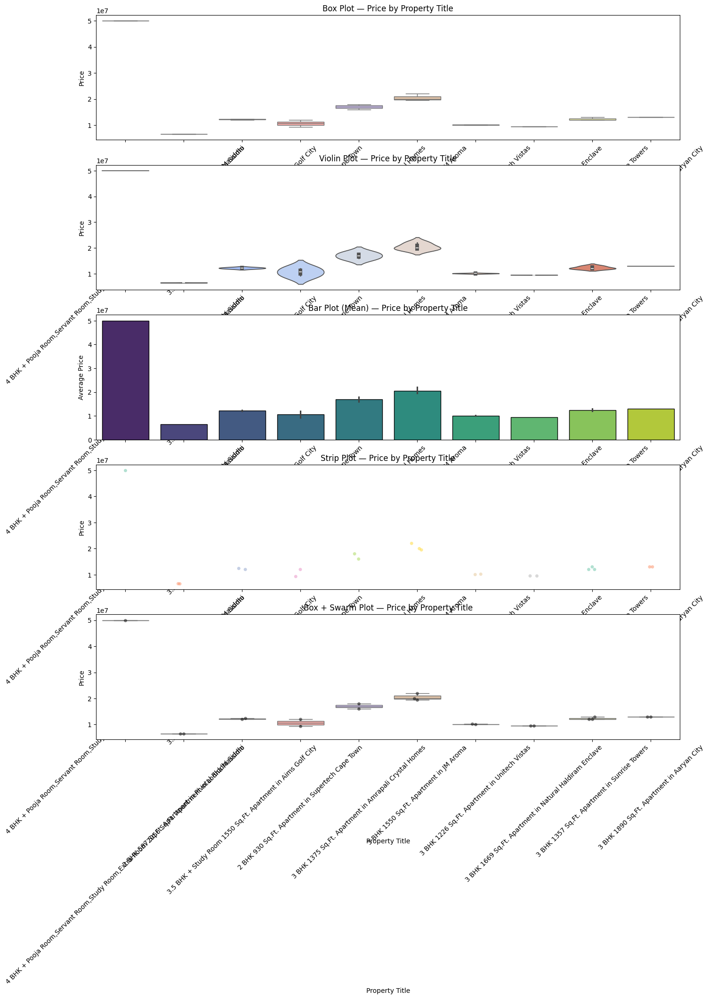


🔹 Analyzing 'Property Title' vs 'BHK'


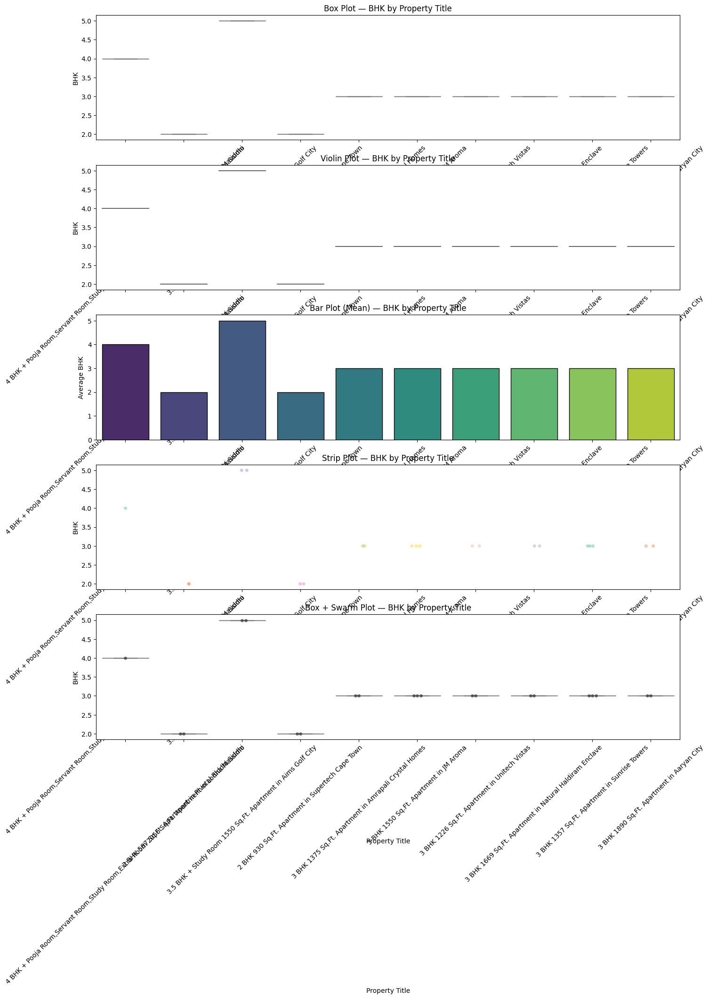


🔹 Analyzing 'Property Title' vs 'Area_SqFt_Number'


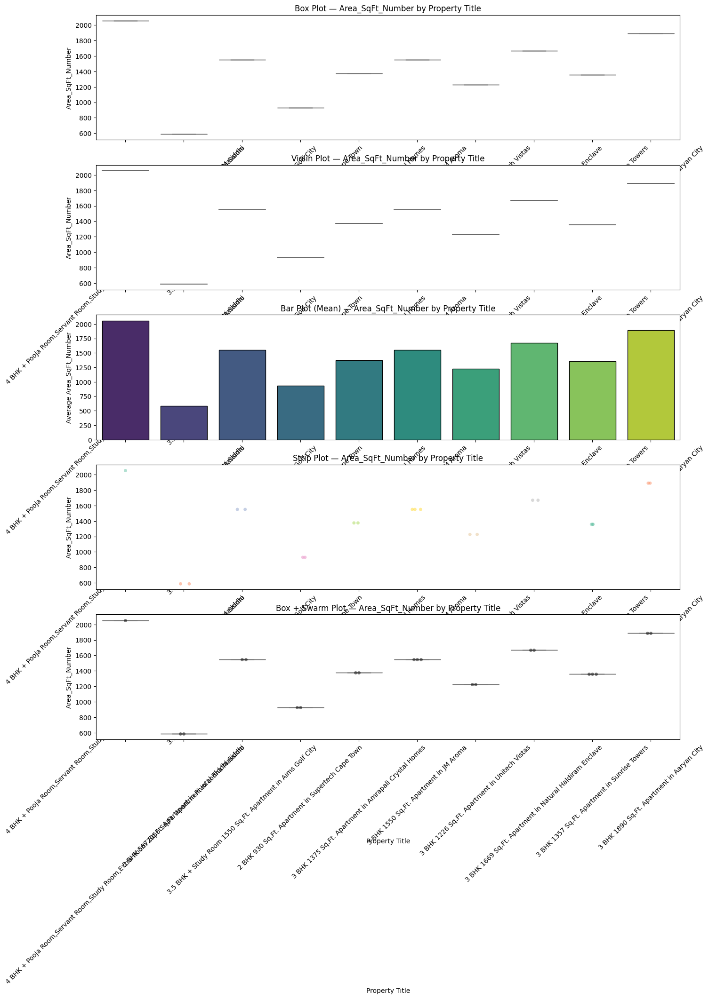


🔹 Analyzing 'Property Title' vs 'Area_per_SqFt_Price'


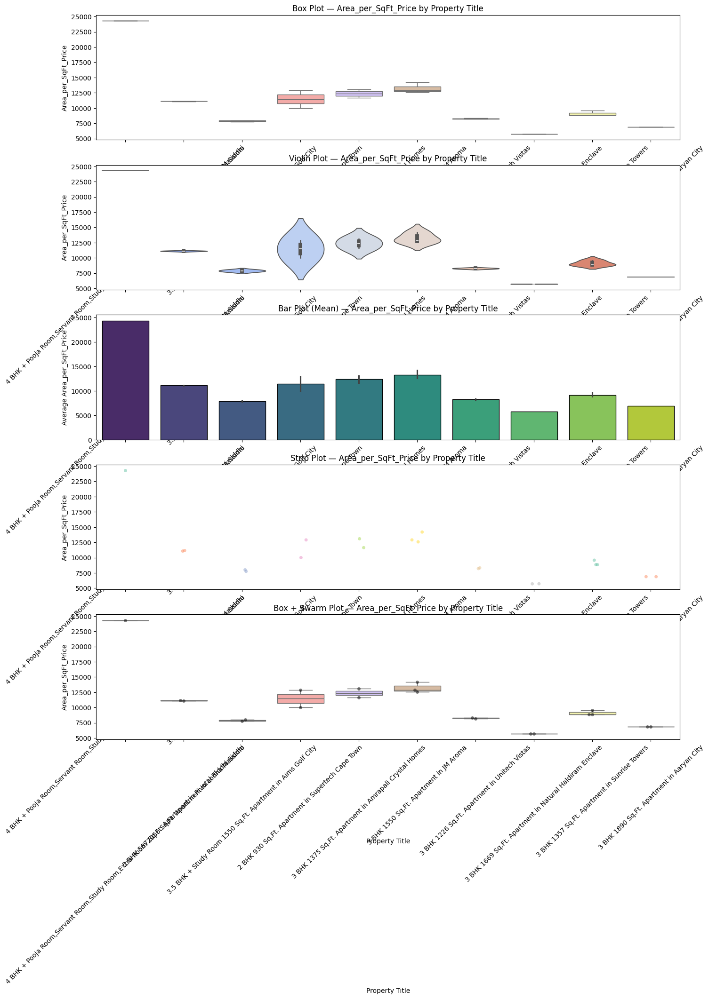


🔹 Analyzing 'Property Type' vs 'Price'


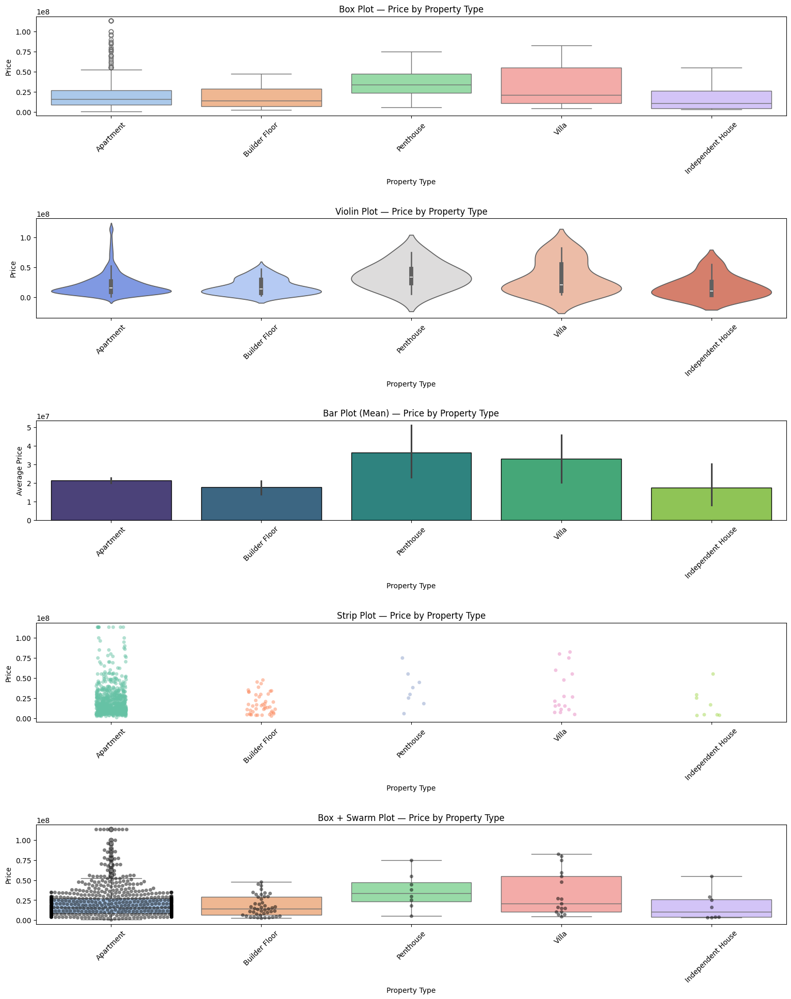


🔹 Analyzing 'Property Type' vs 'BHK'


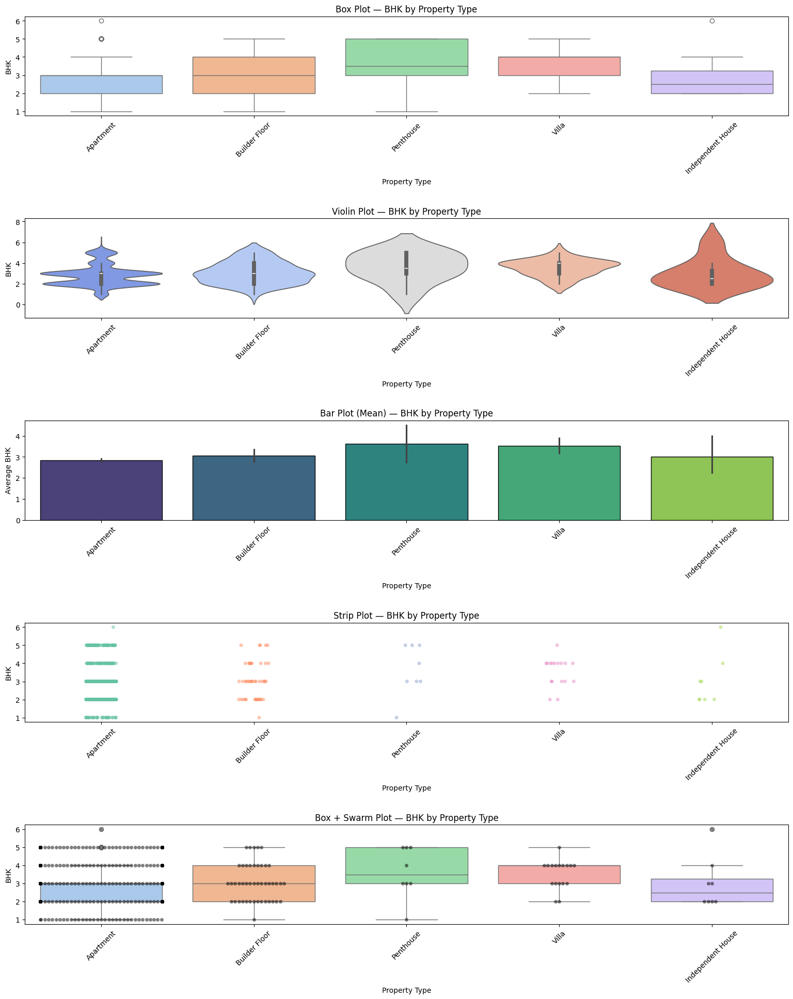


🔹 Analyzing 'Property Type' vs 'Area_SqFt_Number'


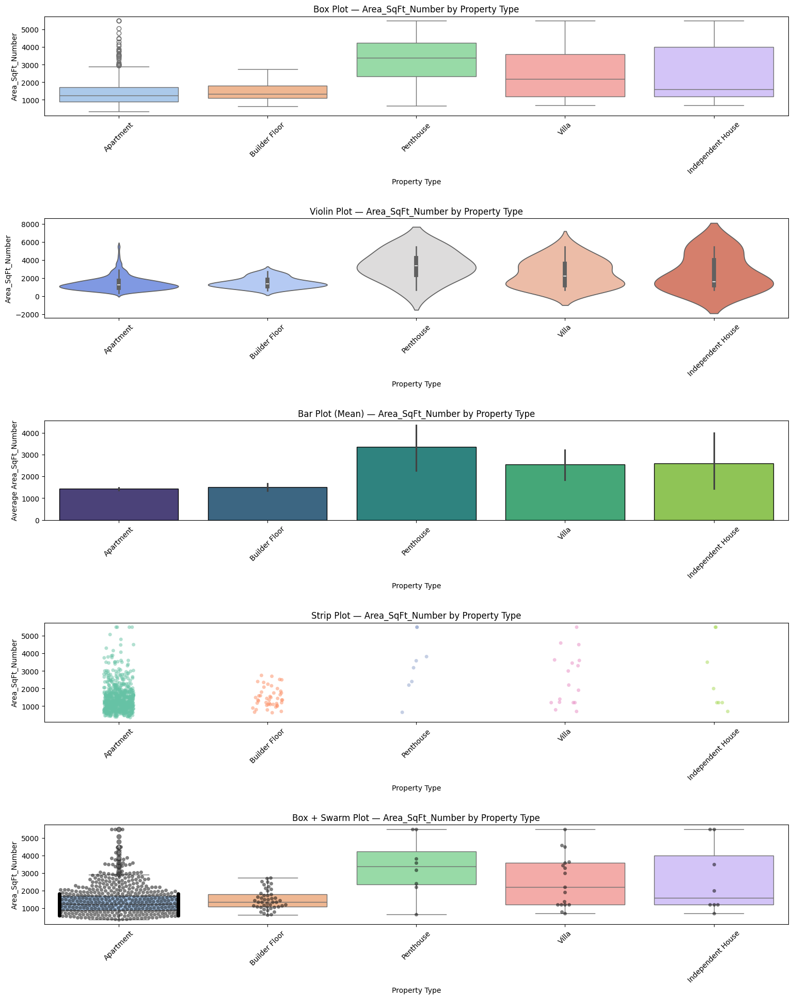


🔹 Analyzing 'Property Type' vs 'Area_per_SqFt_Price'


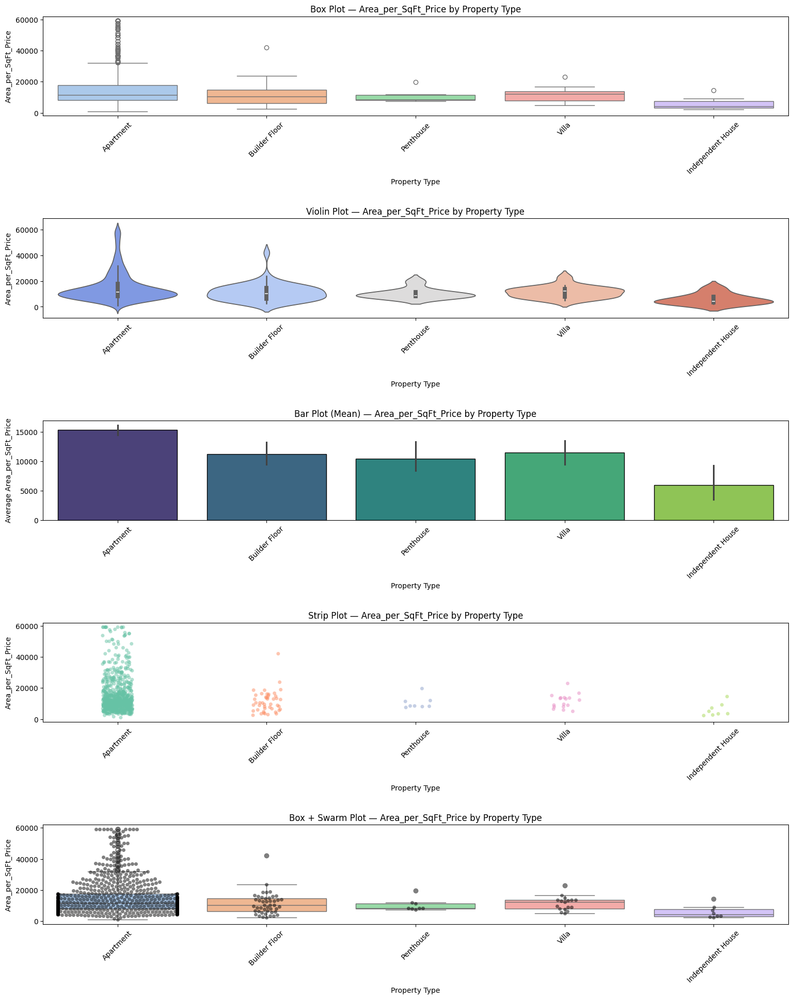


🔹 Analyzing 'Locality' vs 'Price'


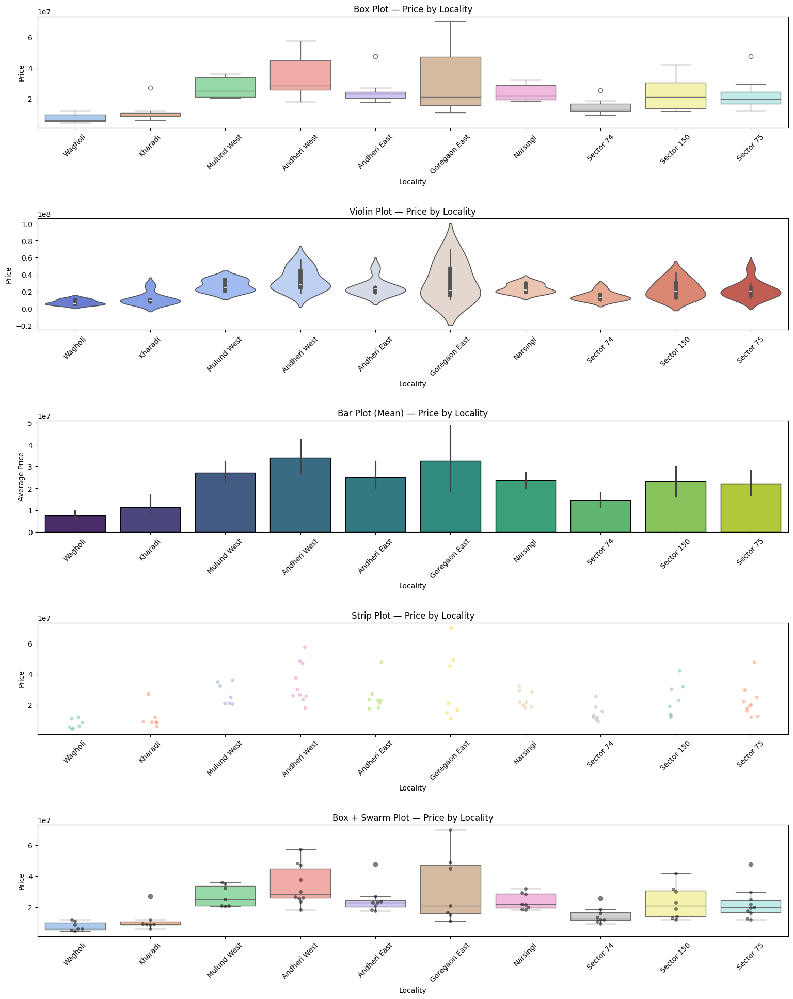


🔹 Analyzing 'Locality' vs 'BHK'


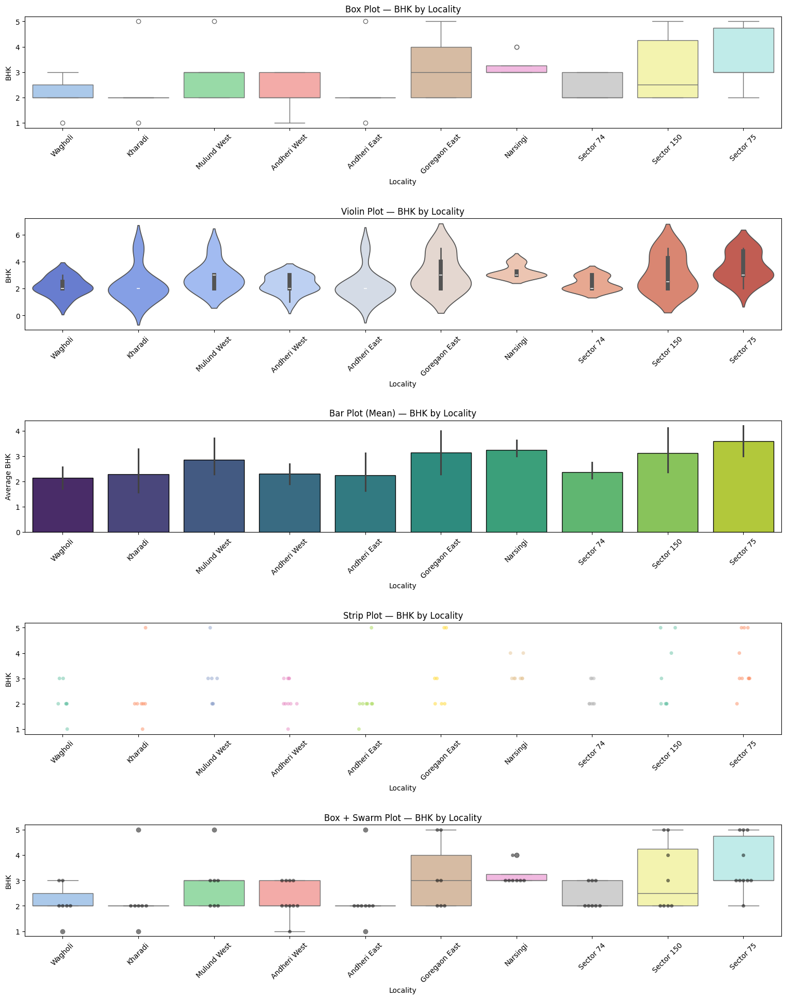


🔹 Analyzing 'Locality' vs 'Area_SqFt_Number'


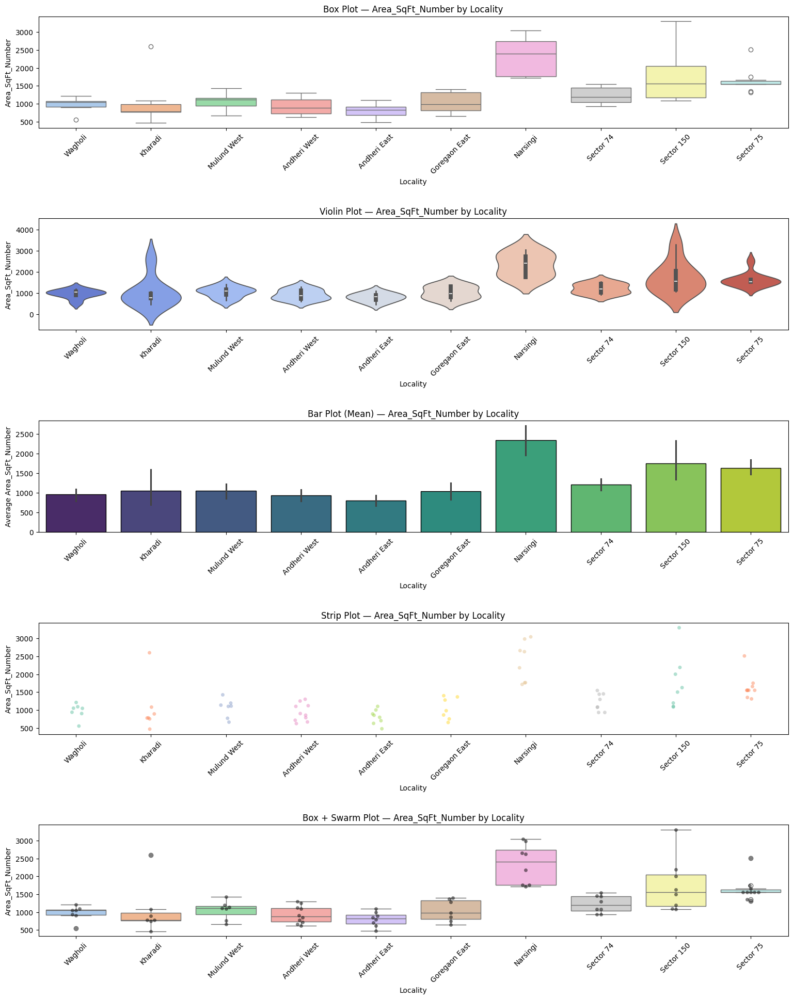


🔹 Analyzing 'Locality' vs 'Area_per_SqFt_Price'


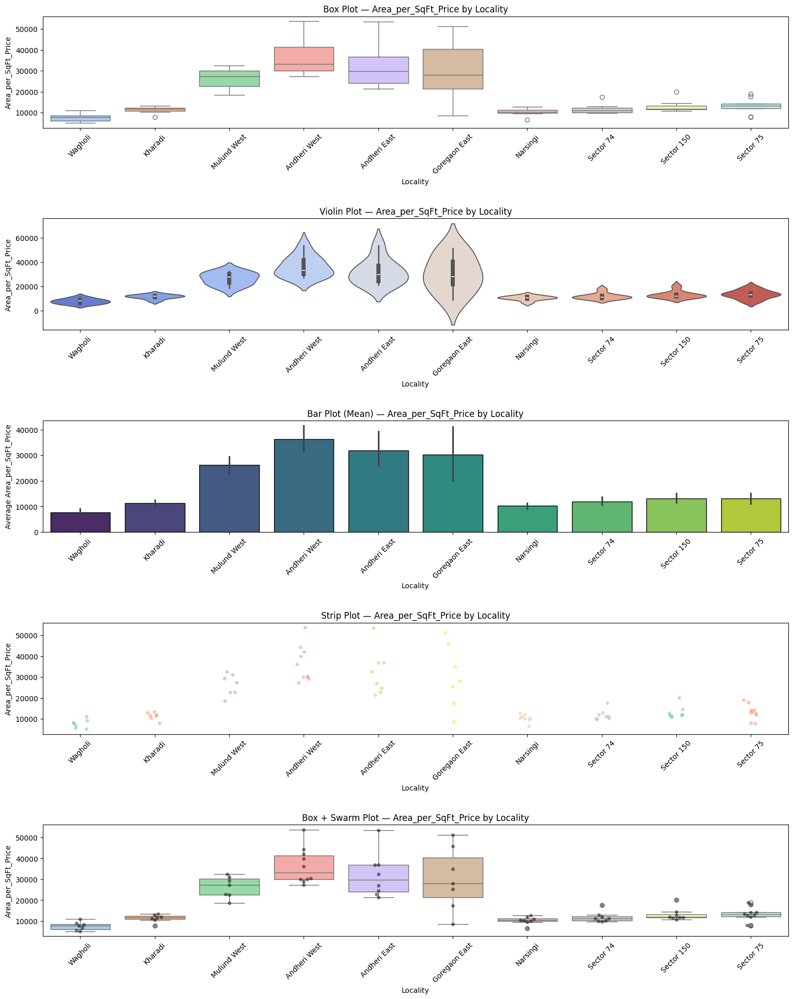

In [10]:

# Run full categorical vs numerical analysis
categorical_vs_numerical_analysis(data, top_n=10)


In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def simple_categorical_vs_numerical(df, top_n=10):
    """
    Simplified version of categorical vs numerical analysis.
    Creates side-by-side Box Plot & Bar Plot (Mean) for each categorical-numerical pair.
    """

    # Detect categorical and numerical columns
    cat_cols = df.select_dtypes(include=['object']).columns.tolist()
    num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    print("📋 Categorical Columns:", cat_cols)
    print("📊 Numerical Columns:", num_cols)
    print("-" * 80)

    # Loop through each categorical-numerical pair
    for cat in cat_cols:
        for num in num_cols:
            print(f"\n🔹 Analyzing '{cat}' vs '{num}'")

            # Keep top N categories only for clean visuals
            top_categories = df[cat].value_counts().nlargest(top_n).index
            temp_df = df[df[cat].isin(top_categories)]

            if temp_df[num].nunique() <= 1:
                continue  # Skip if no variation

            # --- Create side-by-side layout ---
            fig, axes = plt.subplots(1, 2, figsize=(14, 5))
            fig.suptitle(f"{num} by {cat}", fontsize=14, weight='bold')

            # 1️⃣ Box Plot (Distribution)
            sns.boxplot(data=temp_df, x=cat, y=num, palette='pastel', ax=axes[0])
            axes[0].set_title(f"Distribution of {num} by {cat}")
            axes[0].set_xlabel(cat)
            axes[0].set_ylabel(num)
            axes[0].tick_params(axis='x', rotation=45)

            # 2️⃣ Bar Plot (Mean)
            sns.barplot(data=temp_df, x=cat, y=num, estimator=np.mean,
                        palette='viridis', edgecolor='black', ax=axes[1])
            axes[1].set_title(f"Average {num} by {cat}")
            axes[1].set_xlabel(cat)
            axes[1].set_ylabel(f"Average {num}")
            axes[1].tick_params(axis='x', rotation=45)

            plt.tight_layout(pad=3)
            plt.show()


📋 Categorical Columns: ['City', 'Location', 'Project Name', 'Property Title', 'Property Type', 'Locality']
📊 Numerical Columns: ['Price', 'BHK', 'Area_SqFt_Number', 'Area_per_SqFt_Price']
--------------------------------------------------------------------------------

🔹 Analyzing 'City' vs 'Price'


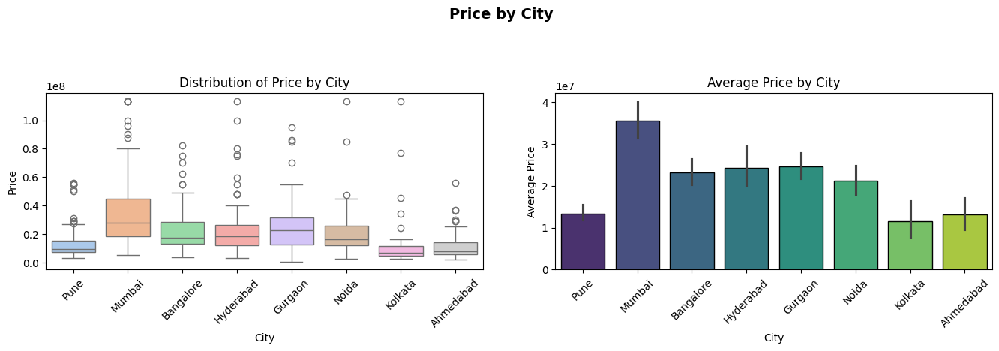


🔹 Analyzing 'City' vs 'BHK'


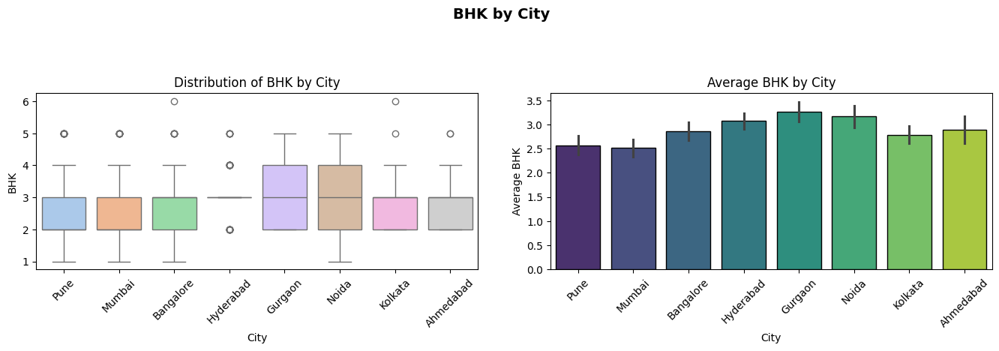


🔹 Analyzing 'City' vs 'Area_SqFt_Number'


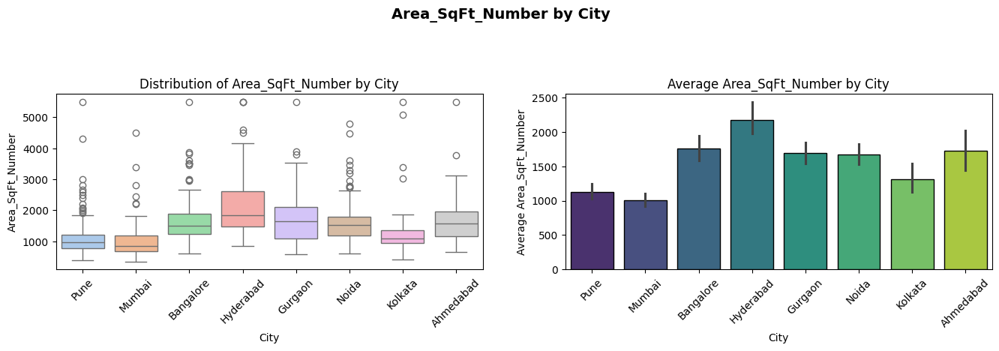


🔹 Analyzing 'City' vs 'Area_per_SqFt_Price'


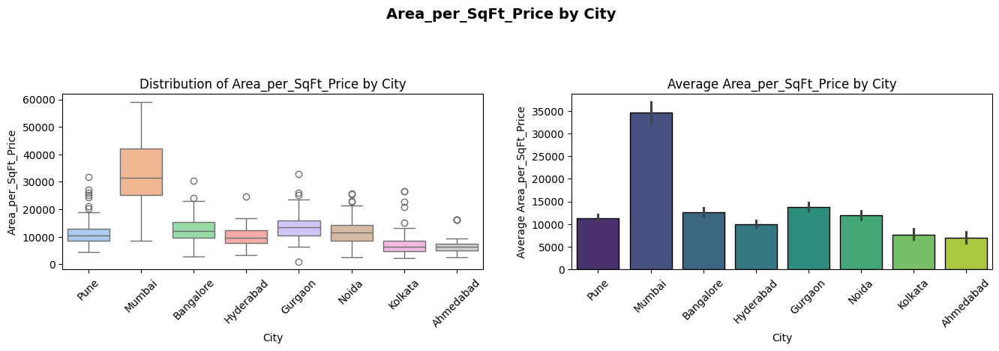


🔹 Analyzing 'Location' vs 'Price'


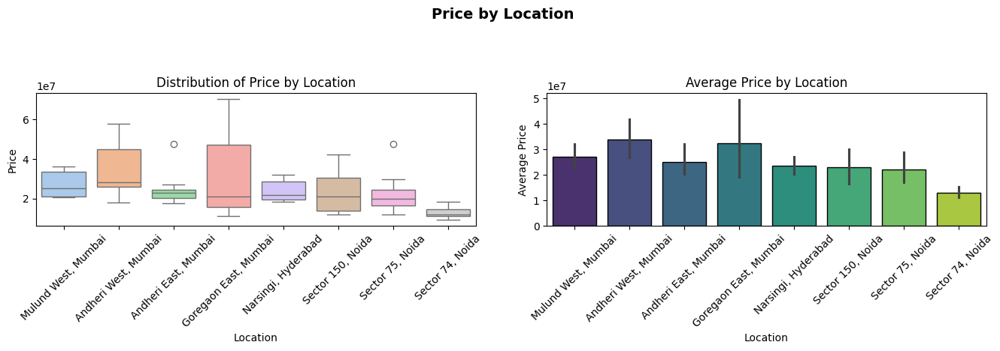


🔹 Analyzing 'Location' vs 'BHK'


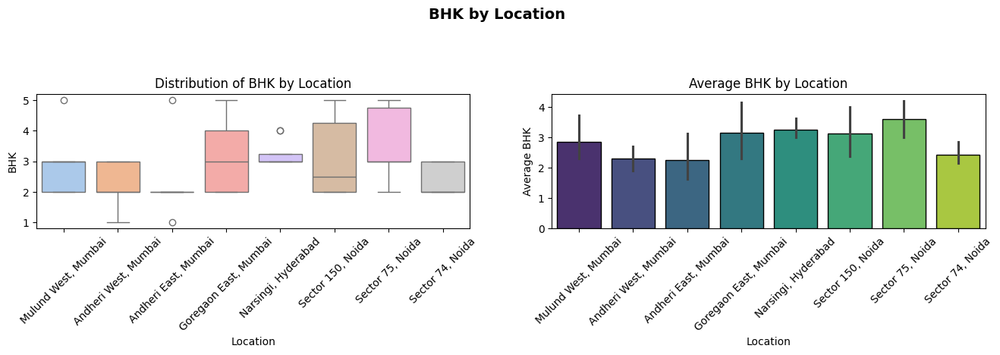


🔹 Analyzing 'Location' vs 'Area_SqFt_Number'


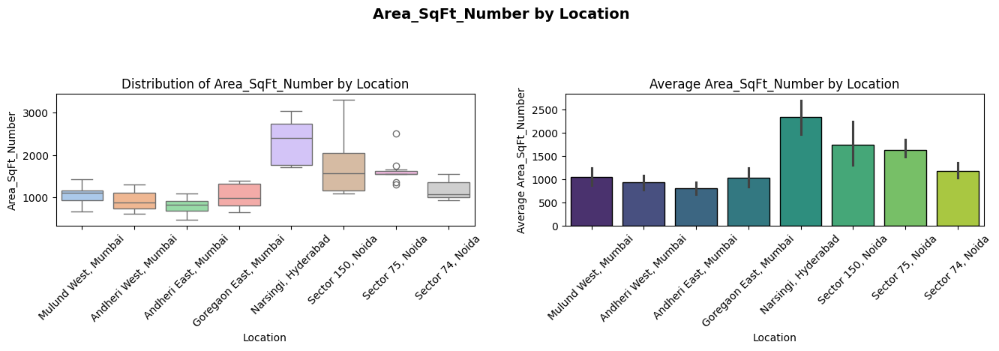


🔹 Analyzing 'Location' vs 'Area_per_SqFt_Price'


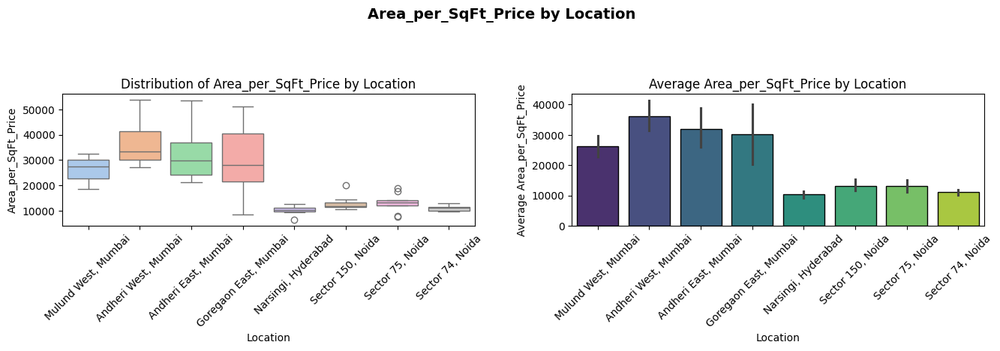


🔹 Analyzing 'Project Name' vs 'Price'


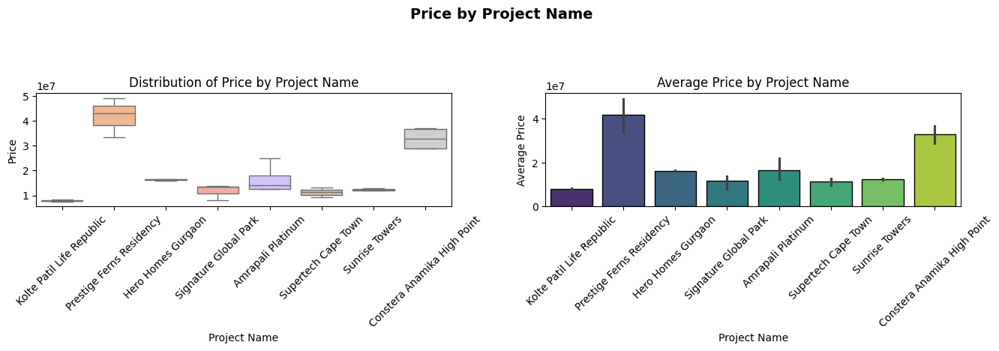


🔹 Analyzing 'Project Name' vs 'BHK'


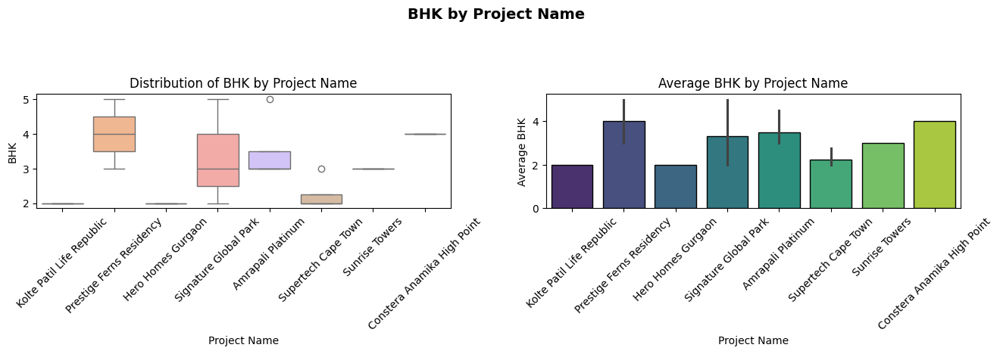


🔹 Analyzing 'Project Name' vs 'Area_SqFt_Number'


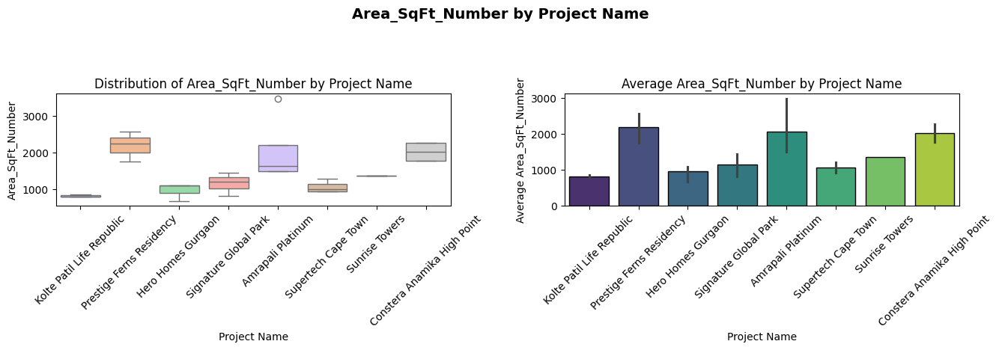


🔹 Analyzing 'Project Name' vs 'Area_per_SqFt_Price'


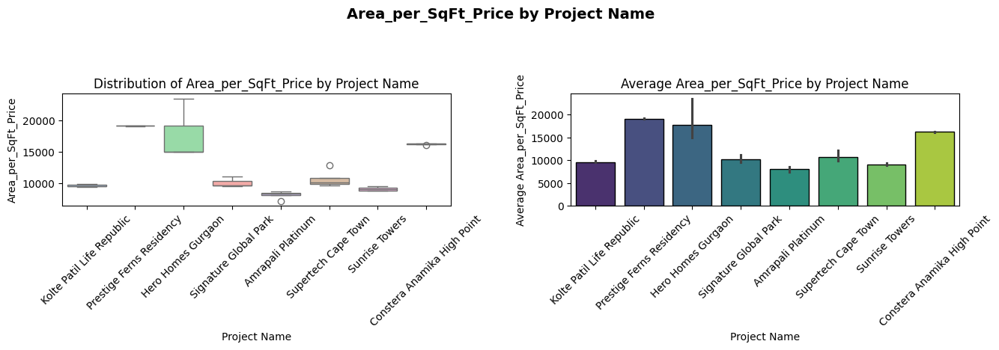


🔹 Analyzing 'Property Title' vs 'Price'


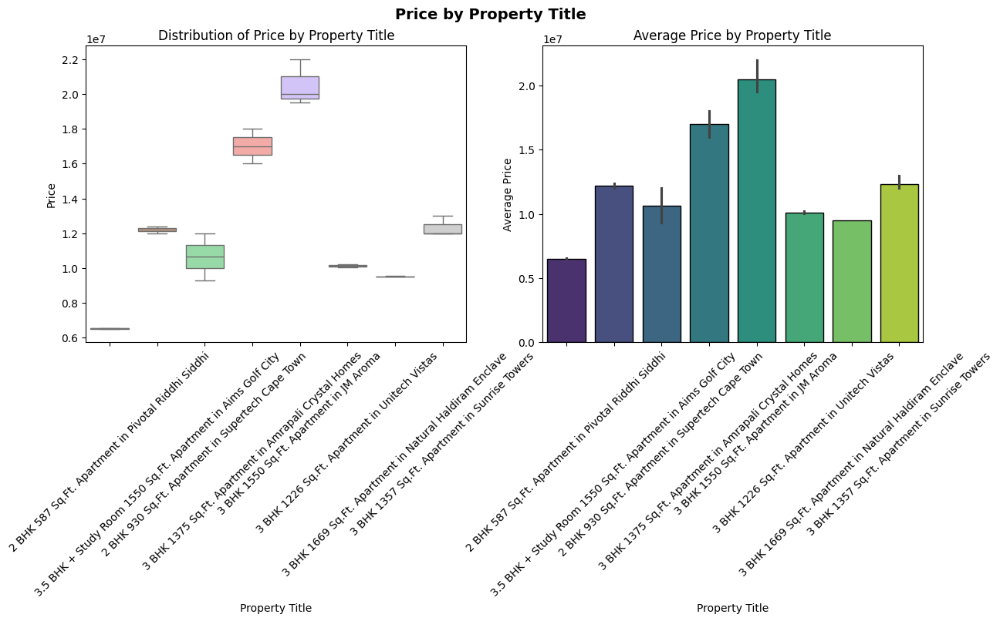


🔹 Analyzing 'Property Title' vs 'BHK'


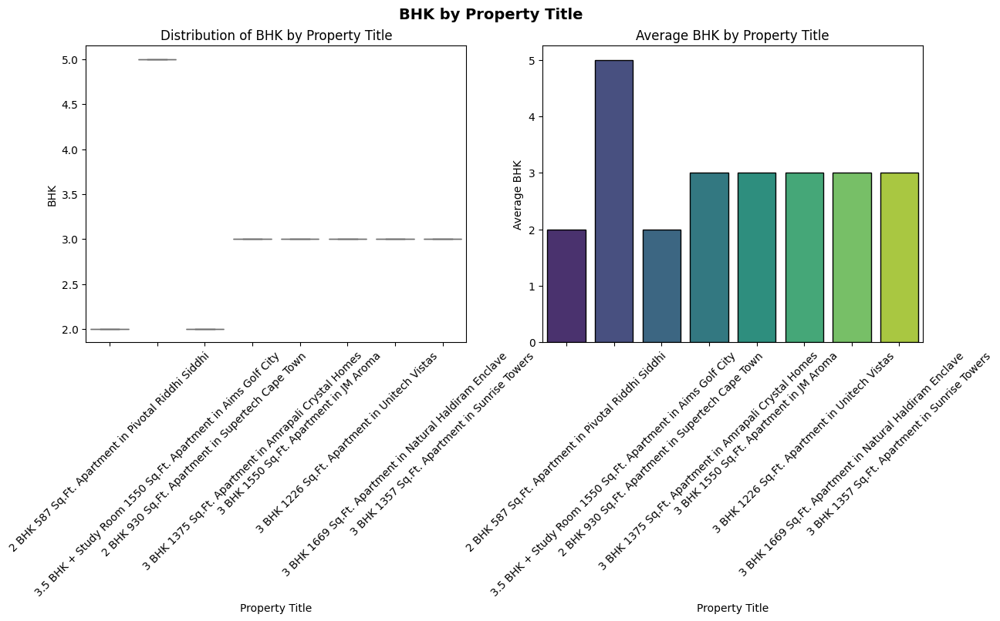


🔹 Analyzing 'Property Title' vs 'Area_SqFt_Number'


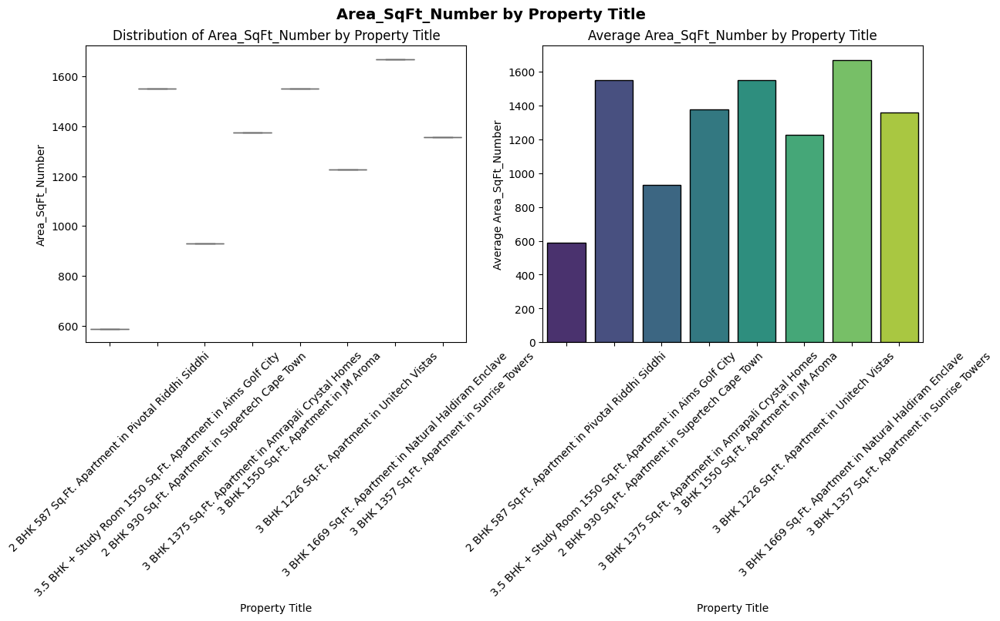


🔹 Analyzing 'Property Title' vs 'Area_per_SqFt_Price'


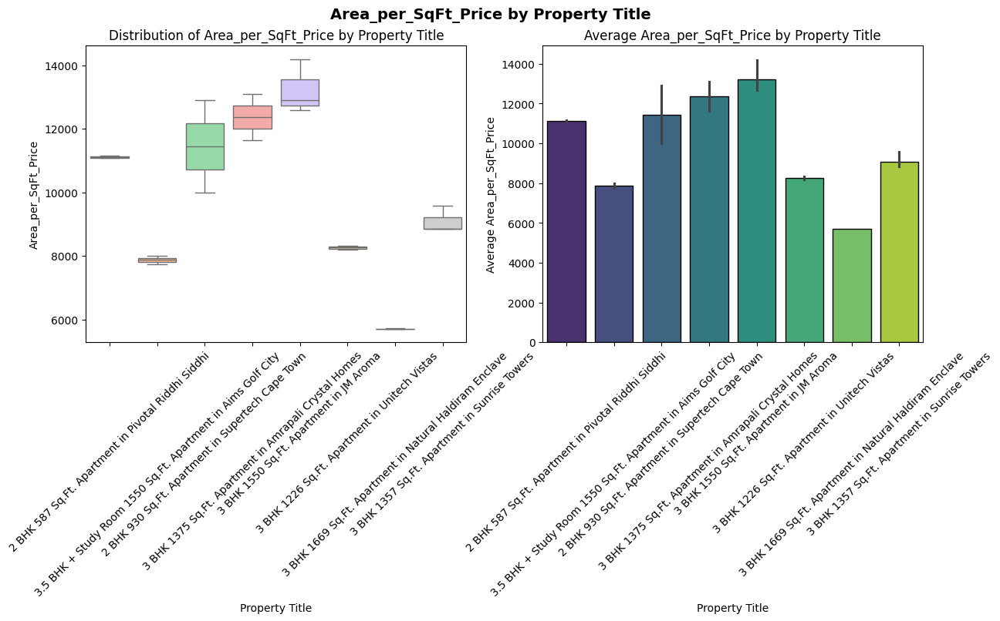


🔹 Analyzing 'Property Type' vs 'Price'


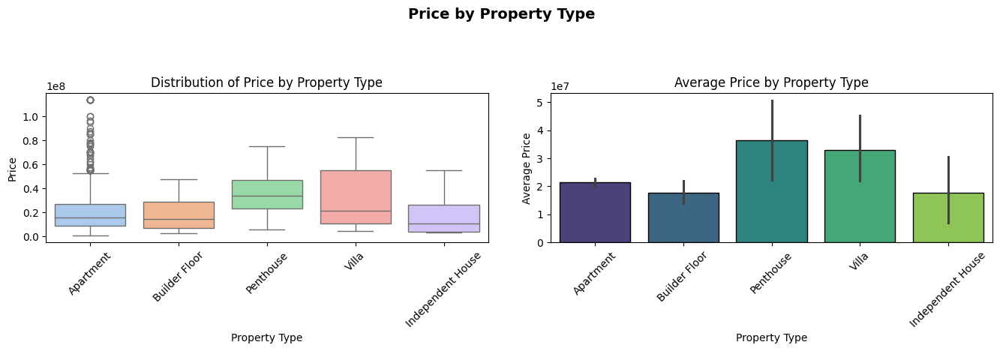


🔹 Analyzing 'Property Type' vs 'BHK'


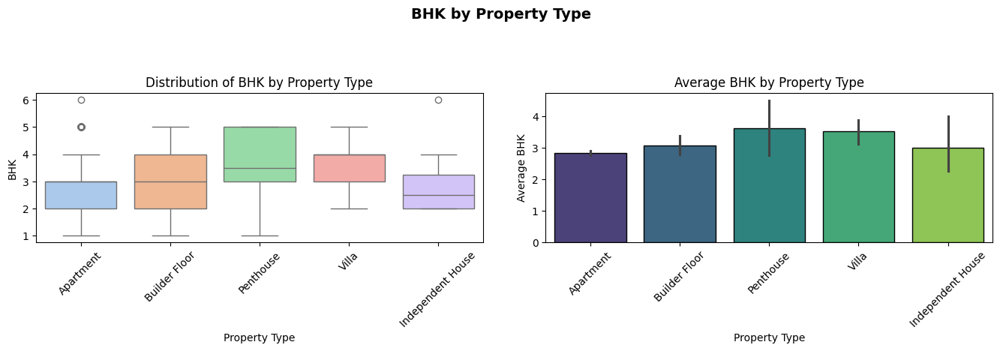


🔹 Analyzing 'Property Type' vs 'Area_SqFt_Number'


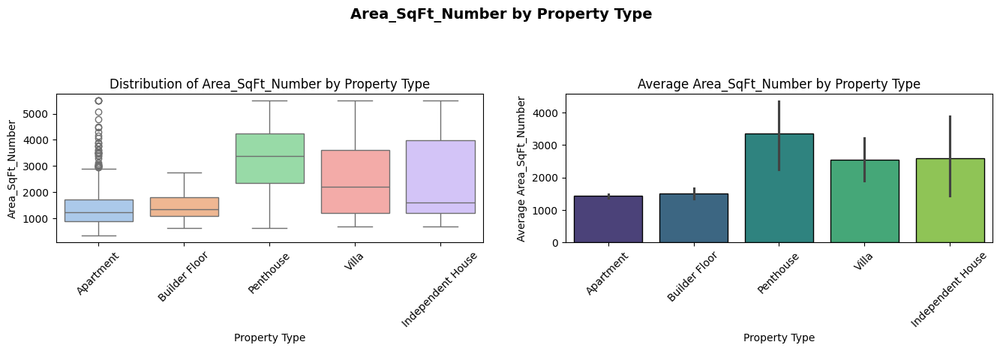


🔹 Analyzing 'Property Type' vs 'Area_per_SqFt_Price'


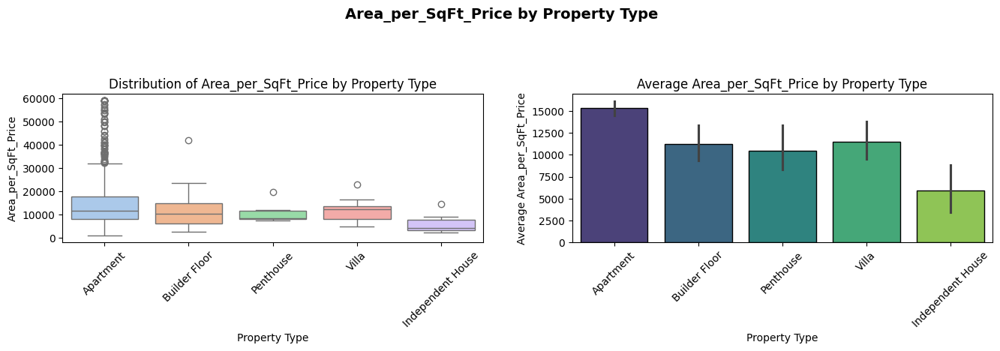


🔹 Analyzing 'Locality' vs 'Price'


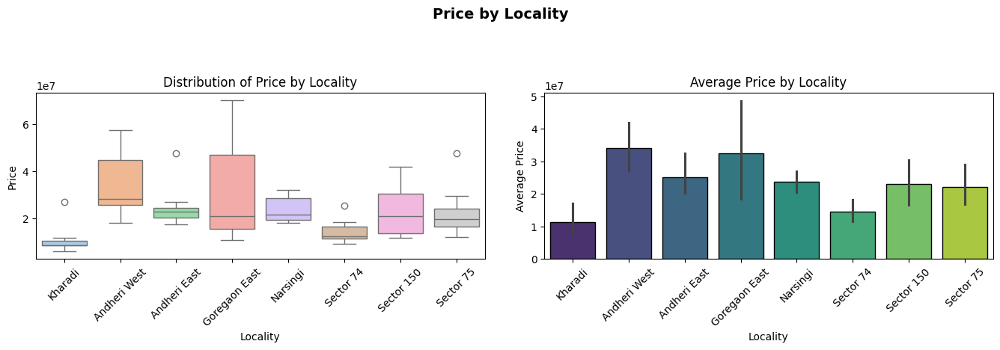


🔹 Analyzing 'Locality' vs 'BHK'


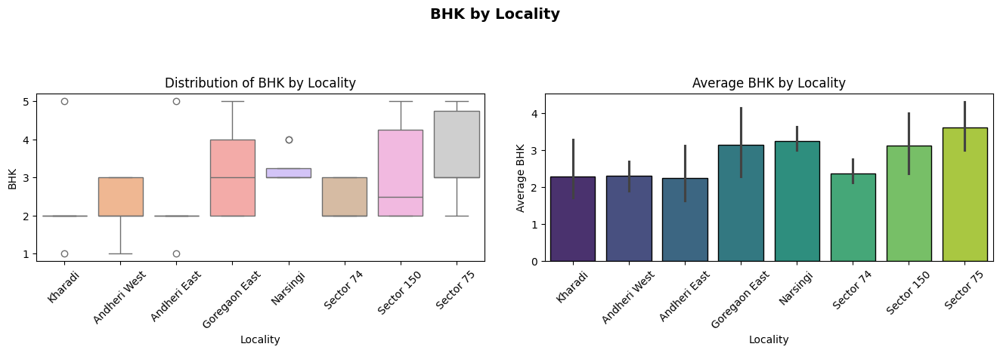


🔹 Analyzing 'Locality' vs 'Area_SqFt_Number'


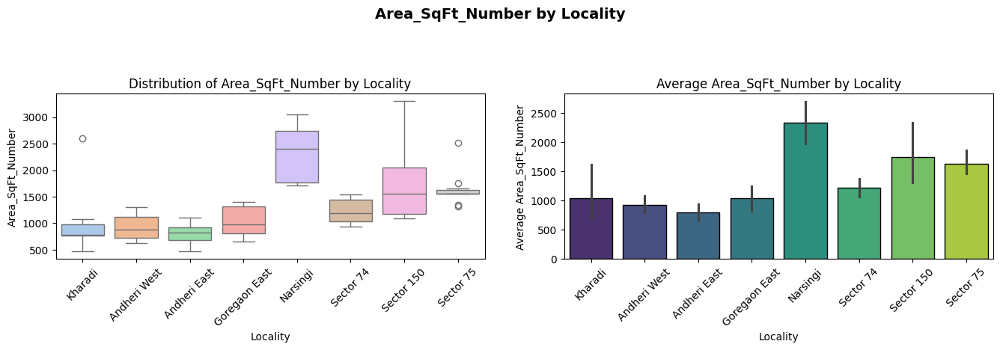


🔹 Analyzing 'Locality' vs 'Area_per_SqFt_Price'


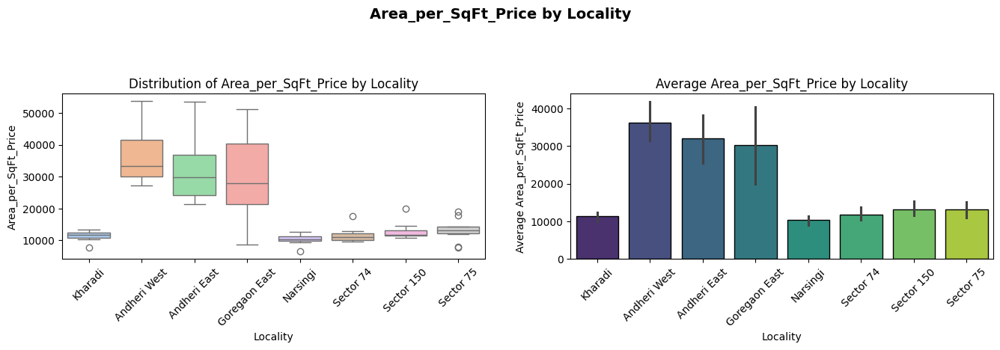

In [13]:
simple_categorical_vs_numerical(data, top_n=8)